### PCA: Electrode Grouping 3  
  
**Grouping 3: Left/Right**  
  
The y-axis electrodes (the z electrodes) will show up in both groups.  
  
**Left:** Fp1, F3, F7, T3, C3, T5, P3, O1, Pz, Cz, Fz  
**Right:** Fp2, F4, F8, T4, C4, T6, P4, O2, Pz, Cz, Fz

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import fastparquet, pyarrow
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [2]:
df = pd.read_csv('nulls_dropped.csv')

In [3]:
df = df.drop(columns = 'row')

##### Target Variable Distribution for Dataframe without EEGs and Spectrograms Missing Values

In [4]:
df['expert_consensus'].value_counts(normalize = True)

expert_consensus
Seizure    0.209216
Other      0.189732
GPD        0.157017
GRDA       0.155822
LRDA       0.146853
LPD        0.141360
Name: proportion, dtype: float64

##### Adding Column to Keep Track of Original Index

In [5]:
df['row'] = [i for i in range(df.shape[0])]

##### Splitting Dataframe by Activity Type

In [6]:
def activity_df(activity):
    return pd.DataFrame(df[df['expert_consensus'] == activity]).reset_index().drop(columns = 'index')

In [7]:
seizure_df = activity_df('Seizure')
lpd_df = activity_df('LPD')
gpd_df = activity_df('GPD')
lrda_df = activity_df('LRDA')
grda_df = activity_df('GRDA')
other_df = activity_df('Other')

##### Function to Read and Scale Sub EEGs

In [8]:
def scale(df, row):
    eeg = pd.read_parquet('train_eegs/{}.parquet'.format(df['eeg_id'][row]), engine = 'pyarrow')
    first_row = int(df['eeg_label_offset_seconds'][row] * 200)
    last_row = int(first_row + 10000)
    sub_eeg = eeg[first_row: last_row]
    electrodes = sub_eeg.columns
    scaler = StandardScaler()
    sub_eeg = scaler.fit_transform(sub_eeg)
    sub_eeg = pd.DataFrame(sub_eeg, columns = electrodes)
    return sub_eeg

##### Function for Plotting EEG Signals

In [9]:
def activity_signal_plots(sub_eegs, activities, electrodes, h, w):
    fig, axs = plt.subplots(len(electrodes), len(sub_eegs))
    fig.set_figheight(h)
    fig.set_figwidth(w)
    fig.tight_layout()
    for i in range(len(electrodes)):
        if len(sub_eegs) == 1:
            axs[i].plot(sub_eegs[0][electrodes[i]])
            axs[i].set_title('{}_{}'.format(activities[0], electrodes[i]))
        else:
            for j in range(len(sub_eegs)):
                axs[i][j].plot(sub_eegs[j][electrodes[i]])
                if len(activities) > 1:
                    axs[i][j].set_title('{}_{}'.format(activities[j], electrodes[i]))
                else:
                    axs[i][j].set_title('{}_{}'.format(activities[0], electrodes[i]))
    plt.show()

##### PCA Function

In [10]:
def pca_function(sub_eeg, group, n):
    sub_eeg = sub_eeg[group]
    pca = PCA(n_components = n, random_state = 42)
    sub_eeg = pca.fit_transform(sub_eeg)
    ratio = pca.explained_variance_ratio_
    sub_eeg = pd.DataFrame(sub_eeg, columns = ['component_{}'.format(i) for i in range(n)])
    return sub_eeg, ratio

### EEG Indexes by Activity Type  
  
These will be manually set to match the random indexes generated in the first notebook so that PCA is being done with the same sets of sub EEGs.

In [11]:
seizure_random = [16905, 3162, 9351, 17307, 10034]
lpd_random = [7342, 8731, 4898, 11493, 639]
gpd_random = [4595, 11408, 537, 12154, 1935]
lrda_random = [388, 11148, 1711, 5242, 3911]
grda_random = [12264, 5631, 8640, 3704, 11767]
other_random = [9492, 10642, 13840, 3519, 1577]

### Explained Variance Ratios to Evaluate PCA

In [19]:
seizure_indexes = [i for i in range(seizure_df.shape[0])]
other_indexes = [i for i in range(other_df.shape[0])]
gpd_indexes = [i for i in range(gpd_df.shape[0])]
grda_indexes = [i for i in range(grda_df.shape[0])]
lrda_indexes = [i for i in range(lrda_df.shape[0])]
lpd_indexes = [i for i in range(lpd_df.shape[0])]

In [20]:
df['expert_consensus'].value_counts(normalize = True)

expert_consensus
Seizure    0.209216
Other      0.189732
GPD        0.157017
GRDA       0.155822
LRDA       0.146853
LPD        0.141360
Name: proportion, dtype: float64

In [21]:
s_count_norm = df['expert_consensus'].value_counts(normalize = True)[0]
o_count_norm = df['expert_consensus'].value_counts(normalize = True)[1]
gpd_count_norm = df['expert_consensus'].value_counts(normalize = True)[2]
grda_count_norm = df['expert_consensus'].value_counts(normalize = True)[3]
lrda_count_norm = df['expert_consensus'].value_counts(normalize = True)[4]
lpd_count_norm = df['expert_consensus'].value_counts(normalize = True)[5]

In [22]:
norm_list = [s_count_norm, o_count_norm, gpd_count_norm, grda_count_norm,
             lrda_count_norm, lpd_count_norm]
activity_counts_1000 = []
for norm in norm_list:
    activity_count = norm * 1000
    activity_counts_1000.append(activity_count)
    
activity_counts_1000

[209.21557739201816,
 189.73176561481444,
 157.01731089596564,
 155.82220719959437,
 146.85289359955576,
 141.3602452980516]

In [23]:
seizure_norm1000 = np.random.choice(seizure_indexes, size = 209, replace = False)
other_norm1000 = np.random.choice(other_indexes, size = 190, replace = False)
gpd_norm1000 = np.random.choice(gpd_indexes, size = 157, replace = False)
grda_norm1000 = np.random.choice(grda_indexes, size = 156, replace = False)
lrda_norm1000 = np.random.choice(lrda_indexes, size = 147, replace = False)
lpd_norm1000 = np.random.choice(lpd_indexes, size = 141, replace = False)

In [24]:
evr2 = []
evr3 = []
evr4 = []

In [26]:
for i in seizure_norm1000:
    seizure_l2components, seizure_evrl2 = pca_function(scale(seizure_df, i), left, 2)
    seizure_r2components, seizure_evrr2 = pca_function(scale(seizure_df, i), right, 2)
    evr2.append(seizure_evrl2.sum())
    evr2.append(seizure_evrr2.sum())
    
    seizure_l3components, seizure_evrl3 = pca_function(scale(seizure_df, i), left, 3)
    seizure_r3components, seizure_evrr3 = pca_function(scale(seizure_df, i), right, 3)
    evr3.append(seizure_evrl3.sum())
    evr3.append(seizure_evrr3.sum())
    
    seizure_l4components, seizure_evrl4 = pca_function(scale(seizure_df, i), left, 4)
    seizure_r4components, seizure_evrr4 = pca_function(scale(seizure_df, i), right, 4)
    evr4.append(seizure_evrl4.sum())
    evr4.append(seizure_evrr4.sum())

In [27]:
for i in lpd_norm1000:
    lpd_l2components, lpd_evrl2 = pca_function(scale(lpd_df, i), left, 2)
    lpd_r2components, lpd_evrr2 = pca_function(scale(lpd_df, i), right, 2)
    evr2.append(lpd_evrl2.sum())
    evr2.append(lpd_evrr2.sum())
    
    lpd_l3components, lpd_evrl3 = pca_function(scale(lpd_df, i), left, 3)
    lpd_r3components, lpd_evrr3 = pca_function(scale(lpd_df, i), right, 3)
    evr3.append(lpd_evrl3.sum())
    evr3.append(lpd_evrr3.sum())
    
    lpd_l4components, lpd_evrl4 = pca_function(scale(lpd_df, i), left, 4)
    lpd_r4components, lpd_evrr4 = pca_function(scale(lpd_df, i), right, 4)
    evr4.append(lpd_evrl4.sum())
    evr4.append(lpd_evrr4.sum())

In [28]:
for i in gpd_norm1000:
    gpd_l2components, gpd_evrl2 = pca_function(scale(gpd_df, i), left, 2)
    gpd_r2components, gpd_evrr2 = pca_function(scale(gpd_df, i), right, 2)
    evr2.append(gpd_evrl2.sum())
    evr2.append(gpd_evrr2.sum())
    
    gpd_l3components, gpd_evrl3 = pca_function(scale(gpd_df, i), left, 3)
    gpd_r3components, gpd_evrr3 = pca_function(scale(gpd_df, i), right, 3)
    evr3.append(gpd_evrl3.sum())
    evr3.append(gpd_evrr3.sum())
    
    gpd_l4components, gpd_evrl4 = pca_function(scale(gpd_df, i), left, 4)
    gpd_r4components, gpd_evrr4 = pca_function(scale(gpd_df, i), right, 4)
    evr4.append(gpd_evrl4.sum())
    evr4.append(gpd_evrr4.sum())

In [29]:
for i in lrda_norm1000:
    lrda_l2components, lrda_evrl2 = pca_function(scale(lrda_df, i), left, 2)
    lrda_r2components, lrda_evrr2 = pca_function(scale(lrda_df, i), right, 2)
    evr2.append(lrda_evrl2.sum())
    evr2.append(lrda_evrr2.sum())
    
    lrda_l3components, lrda_evrl3 = pca_function(scale(lrda_df, i), left, 3)
    lrda_r3components, lrda_evrr3 = pca_function(scale(lrda_df, i), right, 3)
    evr3.append(lrda_evrl3.sum())
    evr3.append(lrda_evrr3.sum())
    
    lrda_l4components, lrda_evrl4 = pca_function(scale(lrda_df, i), left, 4)
    lrda_r4components, lrda_evrr4 = pca_function(scale(lrda_df, i), right, 4)
    evr4.append(lrda_evrl4.sum())
    evr4.append(lrda_evrr4.sum())

In [30]:
for i in grda_norm1000:
    grda_l2components, grda_evrl2 = pca_function(scale(grda_df, i), left, 2)
    grda_r2components, grda_evrr2 = pca_function(scale(grda_df, i), right, 2)
    evr2.append(grda_evrl2.sum())
    evr2.append(grda_evrr2.sum())
    
    grda_l3components, grda_evrl3 = pca_function(scale(grda_df, i), left, 3)
    grda_r3components, grda_evrr3 = pca_function(scale(grda_df, i), right, 3)
    evr3.append(grda_evrl3.sum())
    evr3.append(grda_evrr3.sum())
    
    grda_l4components, grda_evrl4 = pca_function(scale(grda_df, i), left, 4)
    grda_r4components, grda_evrr4 = pca_function(scale(grda_df, i), right, 4)
    evr4.append(grda_evrl4.sum())
    evr4.append(grda_evrr4.sum())

In [31]:
for i in other_norm1000:
    other_l2components, other_evrl2 = pca_function(scale(other_df, i), left, 2)
    other_r2components, other_evrr2 = pca_function(scale(other_df, i), right, 2)
    evr2.append(other_evrl2.sum())
    evr2.append(other_evrr2.sum())
    
    other_l3components, other_evrl3 = pca_function(scale(other_df, i), left, 3)
    other_r3components, other_evrr3 = pca_function(scale(other_df, i), right, 3)
    evr3.append(other_evrl3.sum())
    evr3.append(other_evrr3.sum())
    
    other_l4components, other_evrl4 = pca_function(scale(other_df, i), left, 4)
    other_r4components, other_evrr4 = pca_function(scale(other_df, i), right, 4)
    evr4.append(other_evrl4.sum())
    evr4.append(other_evrr4.sum())

In [32]:
evr2_left, evr2_right = [], []
evr3_left, evr3_right = [], []
evr4_left, evr4_right = [], []

for i in range(2000):
    if (i + 1) % 2 == 0:
        evr2_right.append(evr2[i])
        evr3_right.append(evr3[i])
        evr4_right.append(evr4[i])
    else:
        evr2_left.append(evr2[i])
        evr3_left.append(evr3[i])
        evr4_left.append(evr4[i])

In [33]:
print('Variance Explained N = 2 Mean: {}, Median: {}'.format(np.mean(np.asarray(evr2)),
                                                             np.median(np.asarray(evr2))))
print('Variance Explained N = 3 Mean: {}, Median: {}'.format(np.mean(np.asarray(evr3)),
                                                             np.median(np.asarray(evr3))))
print('Variance Explained N = 4 Mean: {}, Median: {}'.format(np.mean(np.asarray(evr4)),
                                                             np.median(np.asarray(evr4))))

Variance Explained N = 2 Mean: 0.8402247428894043, Median: 0.8406165838241577
Variance Explained N = 3 Mean: 0.9134792685508728, Median: 0.9228327870368958
Variance Explained N = 4 Mean: 0.9479568600654602, Median: 0.9553202390670776


In [34]:
print('Left Variance Explained N = 2 Mean: {}, Median: {}'.format(np.mean(np.asarray(evr2_left)),
                                                                  np.median(np.asarray(evr2_left))))
print('Right Variance Explained N = 2 Mean: {}, Median: {}'.format(np.mean(np.asarray(evr2_right)),
                                                                  np.median(np.asarray(evr2_right))))

Front Variance Explained N = 2 Mean: 0.8414908647537231, Median: 0.8419731855392456
Back Variance Explained N = 2 Mean: 0.838958740234375, Median: 0.8393559455871582


In [35]:
print('Left Variance Explained N = 3 Mean: {}, Median: {}'.format(np.mean(np.asarray(evr3_left)),
                                                                  np.median(np.asarray(evr3_left))))
print('Right Variance Explained N = 3 Mean: {}, Median: {}'.format(np.mean(np.asarray(evr3_right)),
                                                                  np.median(np.asarray(evr3_right))))

Front Variance Explained N = 3 Mean: 0.9146888256072998, Median: 0.9228327870368958
Back Variance Explained N = 3 Mean: 0.9122695922851562, Median: 0.9228466749191284


In [36]:
print('Left Variance Explained N = 4 Mean: {}, Median: {}'.format(np.mean(np.asarray(evr4_left)),
                                                                  np.median(np.asarray(evr4_left))))
print('Right Variance Explained N = 4 Mean: {}, Median: {}'.format(np.mean(np.asarray(evr4_right)),
                                                                  np.median(np.asarray(evr4_right))))

Front Variance Explained N = 4 Mean: 0.9490845203399658, Median: 0.9548866748809814
Back Variance Explained N = 4 Mean: 0.9468291401863098, Median: 0.9554389715194702


### Grouping 3: Left/Right  
  
**Left:** Fp1, F3, F7, T3, C3, T5, P3, O1, Pz, Cz, Fz  
**Right:** Fp2, F4, F8, T4, C4, T6, P4, O2, Pz, Cz, Fz

In [12]:
left = ['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz', 'Pz']
right = ['Fz', 'Cz', 'Pz', 'Fp2', 'F4', 'C4', 'P4', 'F8', 'T4', 'T6', 'O2']

##### Seizure Left Hemisphere

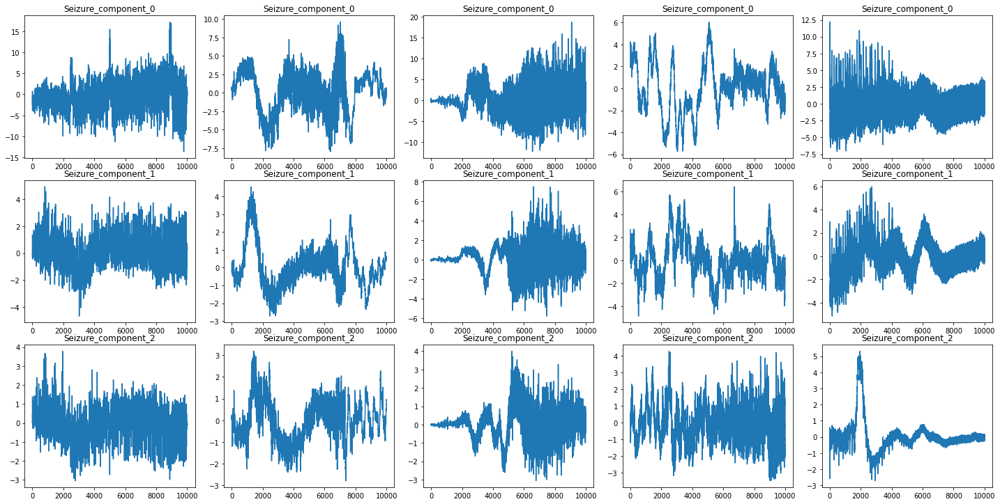

In [13]:
seizure_left_pca1, seizure_left_r1 = pca_function(scale(seizure_df, seizure_random[0]), left, 3)
seizure_left_pca2, seizure_left_r2 = pca_function(scale(seizure_df, seizure_random[1]), left, 3)
seizure_left_pca3, seizure_left_r3 = pca_function(scale(seizure_df, seizure_random[2]), left, 3)
seizure_left_pca4, seizure_left_r4 = pca_function(scale(seizure_df, seizure_random[3]), left, 3)
seizure_left_pca5, seizure_left_r5 = pca_function(scale(seizure_df, seizure_random[4]), left, 3)

components = seizure_left_pca1.columns

sub_eeg_list = [seizure_left_pca1, seizure_left_pca2, seizure_left_pca3, seizure_left_pca4, 
               seizure_left_pca5]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

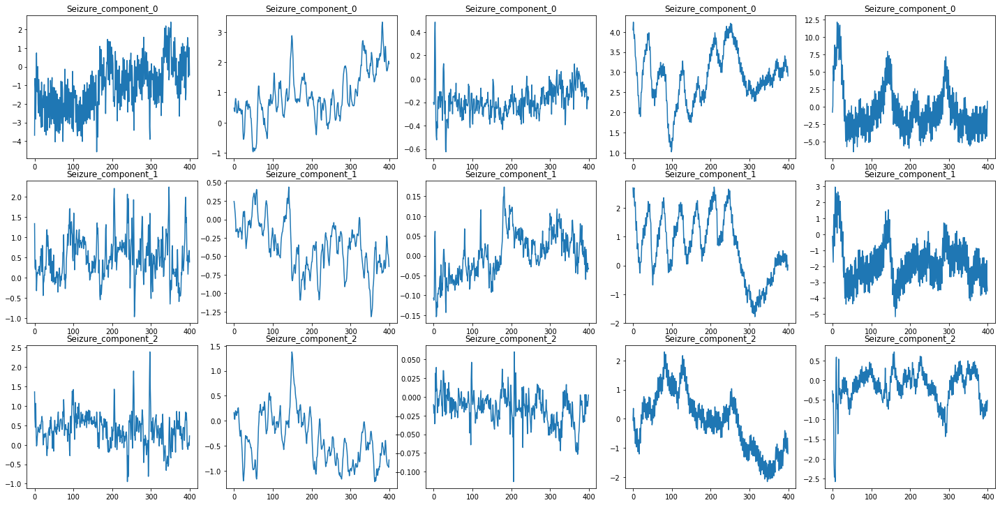

In [14]:
sub_eeg_list = [seizure_left_pca1[0:400], seizure_left_pca2[0:400], seizure_left_pca3[0:400], 
                seizure_left_pca4[0:400], seizure_left_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

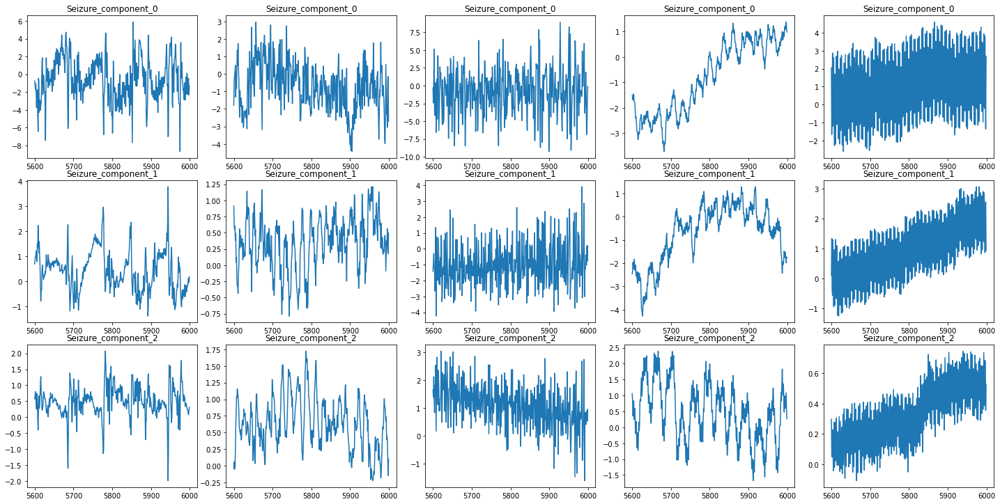

In [15]:
sub_eeg_list = [seizure_left_pca1[5600:6000], seizure_left_pca2[5600:6000], seizure_left_pca3[5600:6000], 
                seizure_left_pca4[5600:6000], seizure_left_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

##### Seizure Right Hemisphere

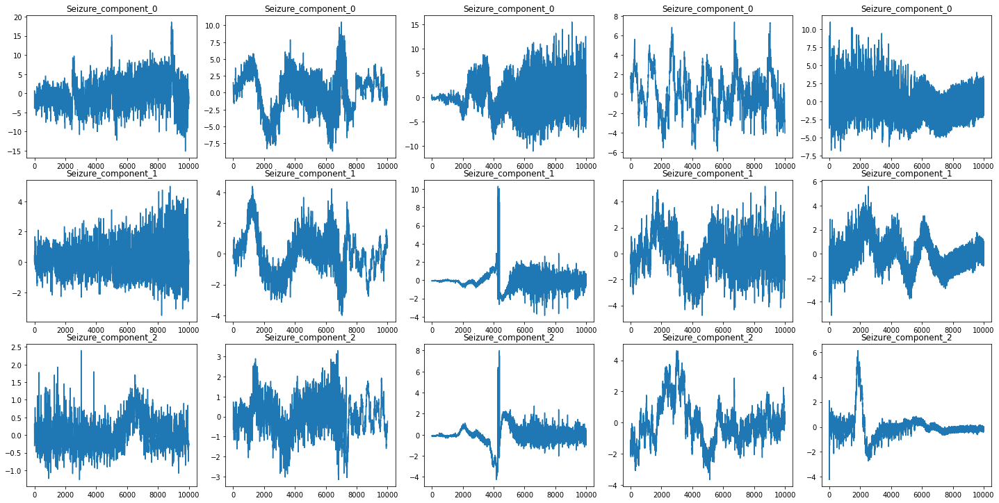

In [16]:
seizure_right_pca1, seizure_right_r1 = pca_function(scale(seizure_df, seizure_random[0]), right, 3)
seizure_right_pca2, seizure_right_r2 = pca_function(scale(seizure_df, seizure_random[1]), right, 3)
seizure_right_pca3, seizure_right_r3 = pca_function(scale(seizure_df, seizure_random[2]), right, 3)
seizure_right_pca4, seizure_right_r4 = pca_function(scale(seizure_df, seizure_random[3]), right, 3)
seizure_right_pca5, seizure_right_r5 = pca_function(scale(seizure_df, seizure_random[4]), right, 3)

components = seizure_right_pca1.columns

sub_eeg_list = [seizure_right_pca1, seizure_right_pca2, seizure_right_pca3, seizure_right_pca4, 
               seizure_right_pca5]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

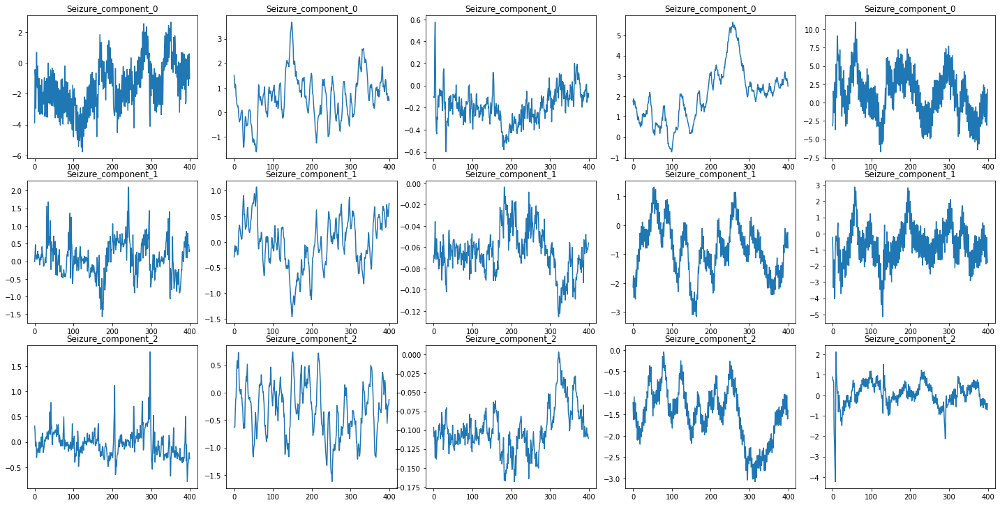

In [17]:
sub_eeg_list = [seizure_right_pca1[0:400], seizure_right_pca2[0:400], seizure_right_pca3[0:400], 
                seizure_right_pca4[0:400], seizure_right_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

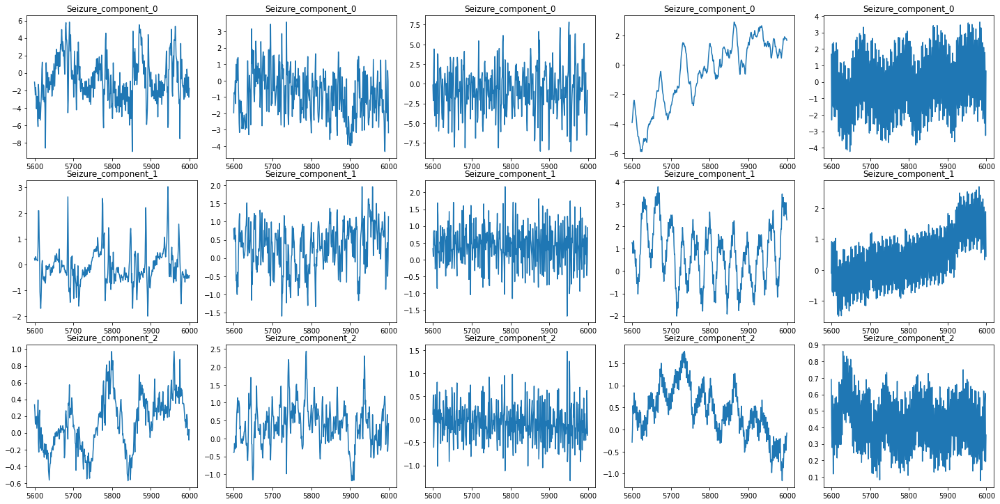

In [18]:
sub_eeg_list = [seizure_right_pca1[5600:6000], seizure_right_pca2[5600:6000], seizure_right_pca3[5600:6000], 
                seizure_right_pca4[5600:6000], seizure_right_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Seizure'], components, 10, 20)

##### LPD Left Hemisphere

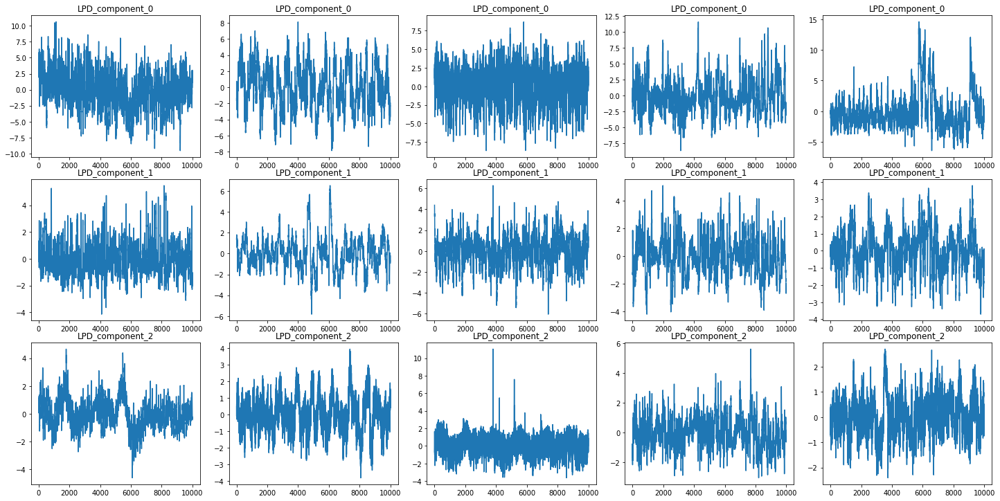

In [19]:
lpd_left_pca1, lpd_left_r1 = pca_function(scale(lpd_df, lpd_random[0]), left, 3)
lpd_left_pca2, lpd_left_r2 = pca_function(scale(lpd_df, lpd_random[1]), left, 3)
lpd_left_pca3, lpd_left_r3 = pca_function(scale(lpd_df, lpd_random[2]), left, 3)
lpd_left_pca4, lpd_left_r4 = pca_function(scale(lpd_df, lpd_random[3]), left, 3)
lpd_left_pca5, lpd_left_r5 = pca_function(scale(lpd_df, lpd_random[4]), left, 3)

components = lpd_left_pca1.columns

sub_eeg_list = [lpd_left_pca1, lpd_left_pca2, lpd_left_pca3, lpd_left_pca4, 
               lpd_left_pca5]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

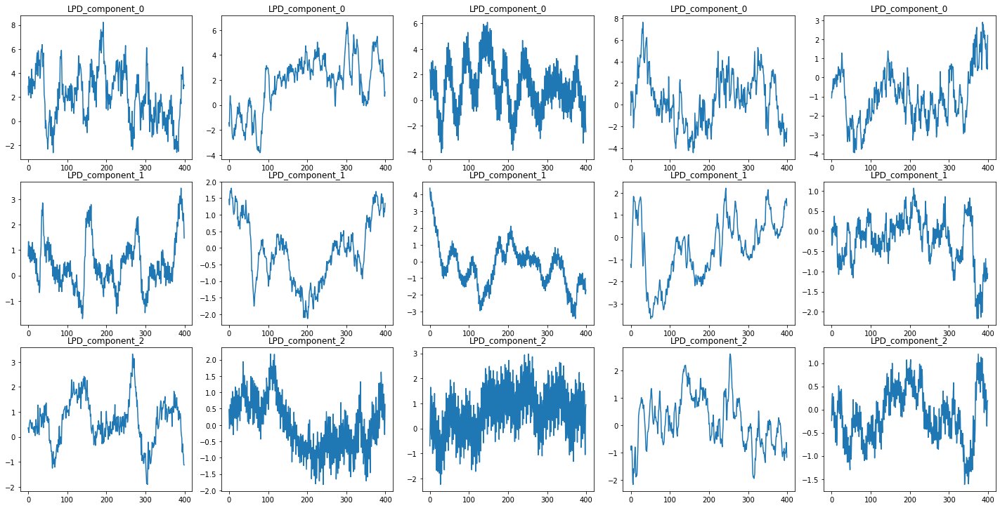

In [20]:
sub_eeg_list = [lpd_left_pca1[0:400], lpd_left_pca2[0:400], lpd_left_pca3[0:400], 
                lpd_left_pca4[0:400], lpd_left_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

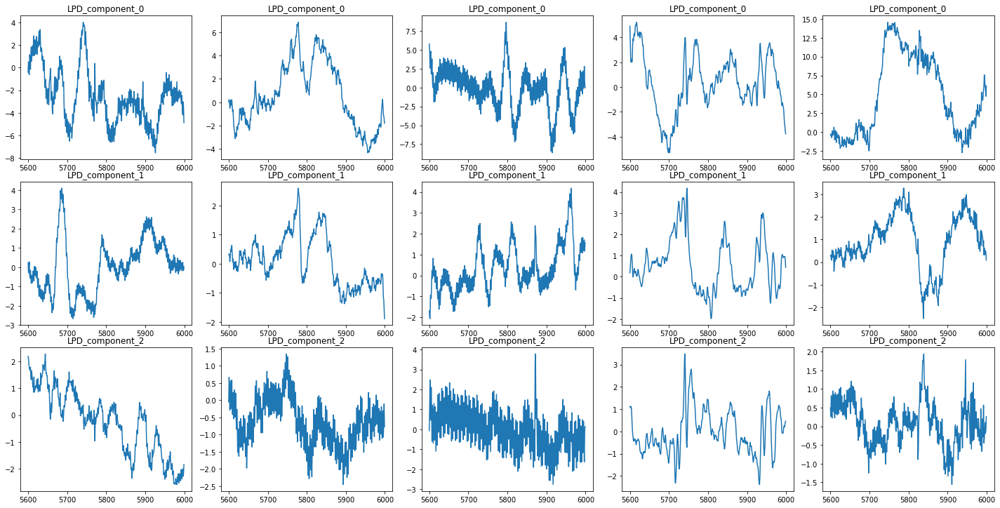

In [21]:
sub_eeg_list = [lpd_left_pca1[5600:6000], lpd_left_pca2[5600:6000], lpd_left_pca3[5600:6000], 
                lpd_left_pca4[5600:6000], lpd_left_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

##### LPD Right Hemisphere

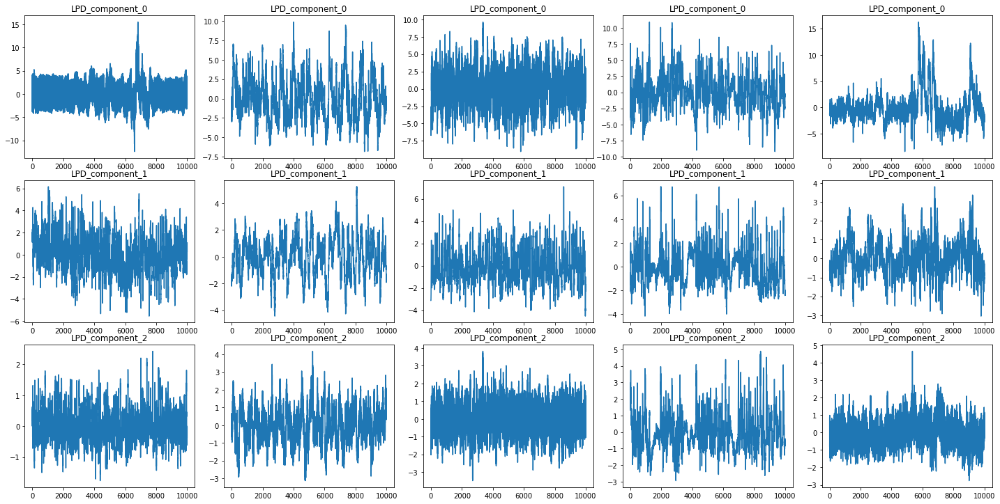

In [22]:
lpd_right_pca1, lpd_right_r1 = pca_function(scale(lpd_df, lpd_random[0]), right, 3)
lpd_right_pca2, lpd_right_r2 = pca_function(scale(lpd_df, lpd_random[1]), right, 3)
lpd_right_pca3, lpd_right_r3 = pca_function(scale(lpd_df, lpd_random[2]), right, 3)
lpd_right_pca4, lpd_right_r4 = pca_function(scale(lpd_df, lpd_random[3]), right, 3)
lpd_right_pca5, lpd_right_r5 = pca_function(scale(lpd_df, lpd_random[4]), right, 3)

components = lpd_right_pca1.columns

sub_eeg_list = [lpd_right_pca1, lpd_right_pca2, lpd_right_pca3, lpd_right_pca4, 
               lpd_right_pca5]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

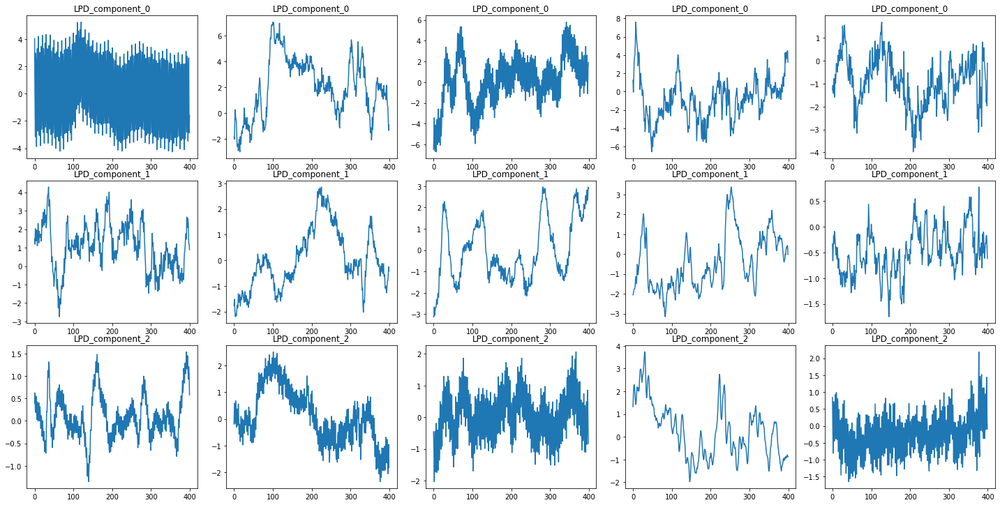

In [23]:
sub_eeg_list = [lpd_right_pca1[0:400], lpd_right_pca2[0:400], lpd_right_pca3[0:400], 
                lpd_right_pca4[0:400], lpd_right_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

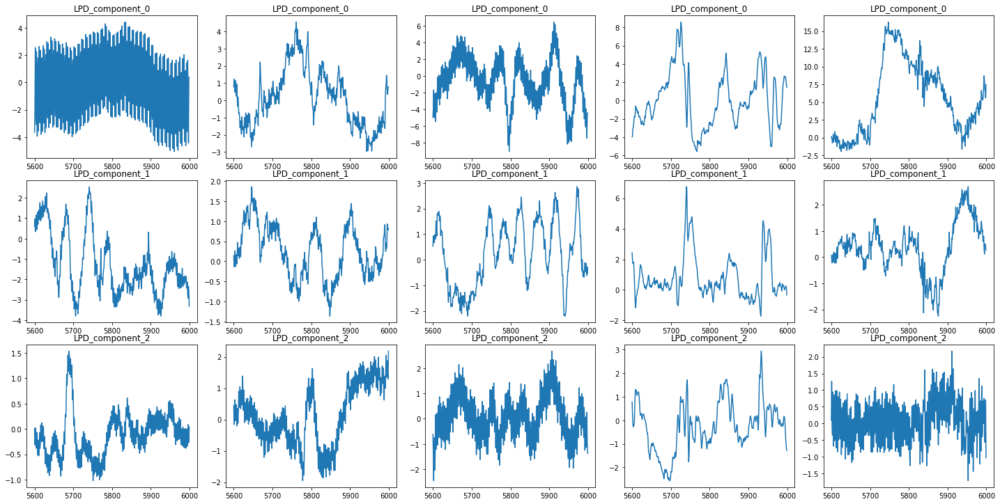

In [24]:
sub_eeg_list = [lpd_right_pca1[5600:6000], lpd_right_pca2[5600:6000], lpd_right_pca3[5600:6000], 
                lpd_right_pca4[5600:6000], lpd_right_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LPD'], components, 10, 20)

##### GPD Left Hemisphere

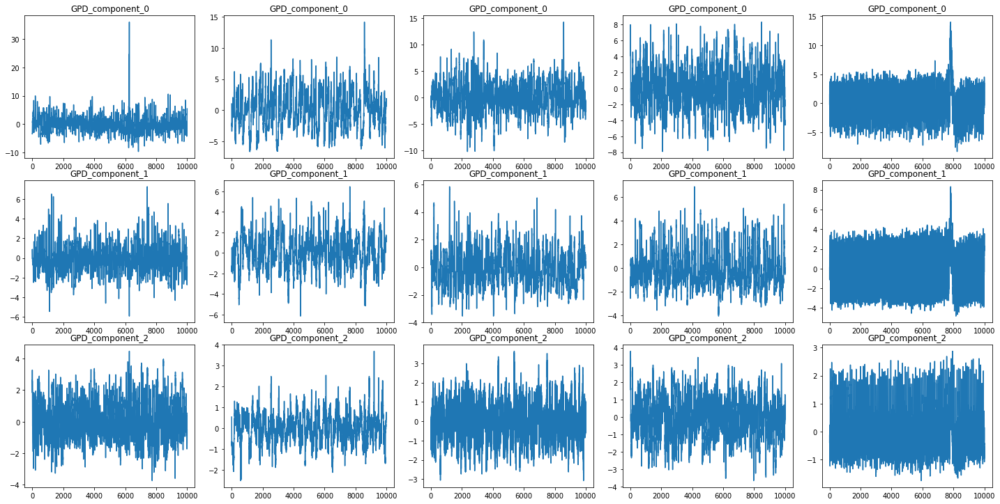

In [25]:
gpd_left_pca1, gpd_left_r1 = pca_function(scale(gpd_df, gpd_random[0]), left, 3)
gpd_left_pca2, gpd_left_r2 = pca_function(scale(gpd_df, gpd_random[1]), left, 3)
gpd_left_pca3, gpd_left_r3 = pca_function(scale(gpd_df, gpd_random[2]), left, 3)
gpd_left_pca4, gpd_left_r4 = pca_function(scale(gpd_df, gpd_random[3]), left, 3)
gpd_left_pca5, gpd_left_r5 = pca_function(scale(gpd_df, gpd_random[4]), left, 3)

components = gpd_left_pca1.columns

sub_eeg_list = [gpd_left_pca1, gpd_left_pca2, gpd_left_pca3, gpd_left_pca4, 
               gpd_left_pca5]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

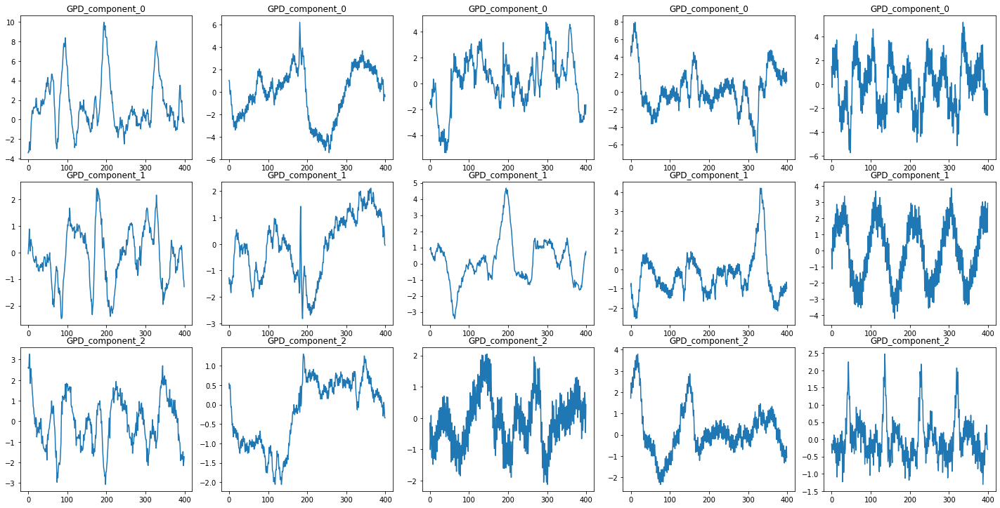

In [26]:
sub_eeg_list = [gpd_left_pca1[0:400], gpd_left_pca2[0:400], gpd_left_pca3[0:400], 
                gpd_left_pca4[0:400], gpd_left_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

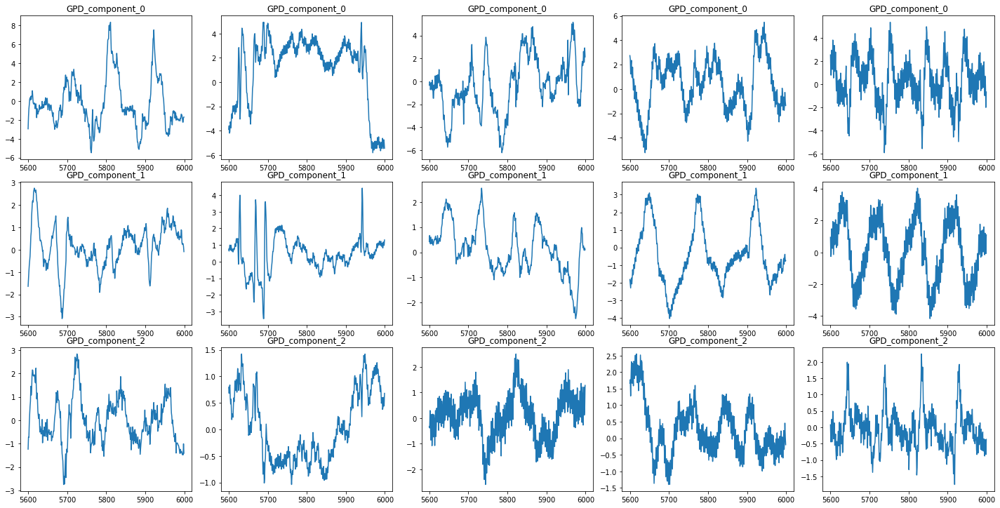

In [27]:
sub_eeg_list = [gpd_left_pca1[5600:6000], gpd_left_pca2[5600:6000], gpd_left_pca3[5600:6000], 
                gpd_left_pca4[5600:6000], gpd_left_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

##### GPD Right Hemisphere

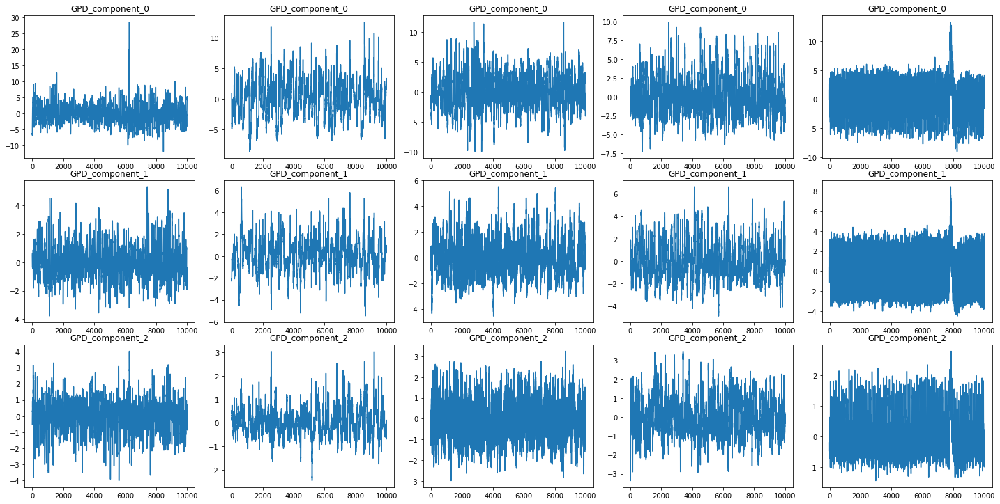

In [28]:
gpd_right_pca1, gpd_right_r1 = pca_function(scale(gpd_df, gpd_random[0]), right, 3)
gpd_right_pca2, gpd_right_r2 = pca_function(scale(gpd_df, gpd_random[1]), right, 3)
gpd_right_pca3, gpd_right_r3 = pca_function(scale(gpd_df, gpd_random[2]), right, 3)
gpd_right_pca4, gpd_right_r4 = pca_function(scale(gpd_df, gpd_random[3]), right, 3)
gpd_right_pca5, gpd_right_r5 = pca_function(scale(gpd_df, gpd_random[4]), right, 3)

components = gpd_right_pca1.columns

sub_eeg_list = [gpd_right_pca1, gpd_right_pca2, gpd_right_pca3, gpd_right_pca4, 
               gpd_right_pca5]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

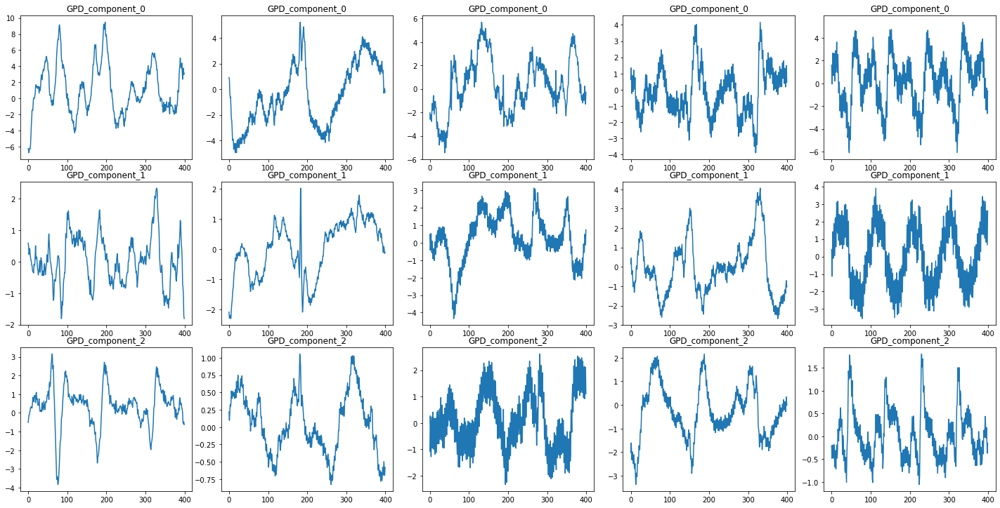

In [29]:
sub_eeg_list = [gpd_right_pca1[0:400], gpd_right_pca2[0:400], gpd_right_pca3[0:400], 
                gpd_right_pca4[0:400], gpd_right_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

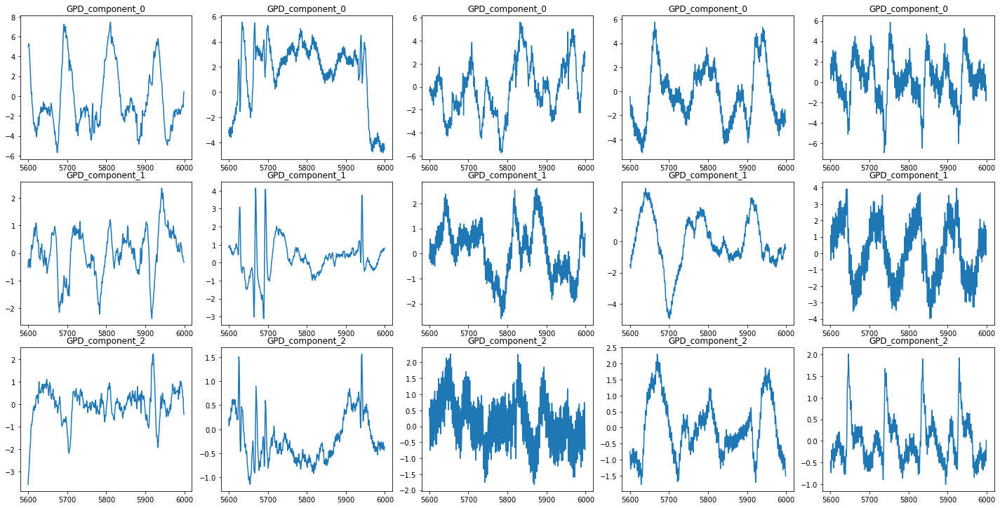

In [30]:
sub_eeg_list = [gpd_right_pca1[5600:6000], gpd_right_pca2[5600:6000], gpd_right_pca3[5600:6000], 
                gpd_right_pca4[5600:6000], gpd_right_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GPD'], components, 10, 20)

##### LRDA Left Hemisphere

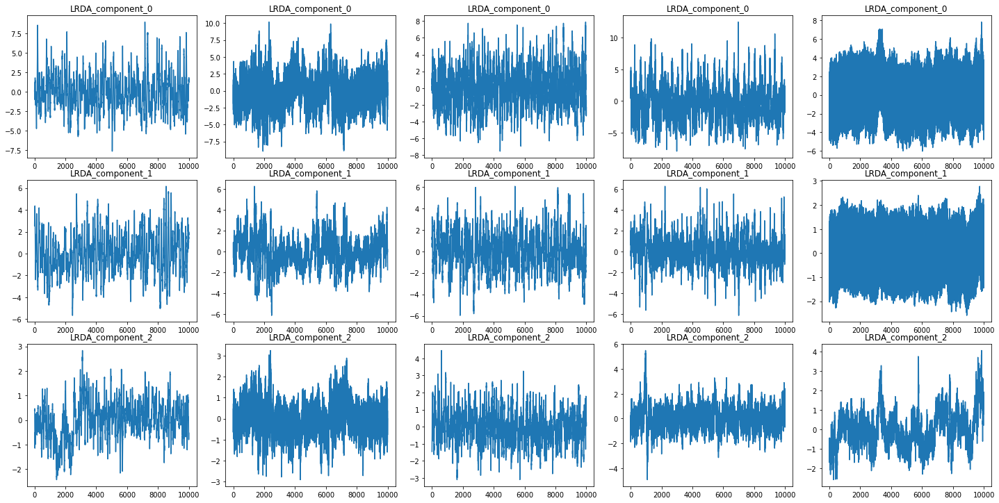

In [31]:
lrda_left_pca1, lrda_left_r1 = pca_function(scale(lrda_df, lrda_random[0]), left, 3)
lrda_left_pca2, lrda_left_r2 = pca_function(scale(lrda_df, lrda_random[1]), left, 3)
lrda_left_pca3, lrda_left_r3 = pca_function(scale(lrda_df, lrda_random[2]), left, 3)
lrda_left_pca4, lrda_left_r4 = pca_function(scale(lrda_df, lrda_random[3]), left, 3)
lrda_left_pca5, lrda_left_r5 = pca_function(scale(lrda_df, lrda_random[4]), left, 3)

components = lrda_left_pca1.columns

sub_eeg_list = [lrda_left_pca1, lrda_left_pca2, lrda_left_pca3, lrda_left_pca4, 
               lrda_left_pca5]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

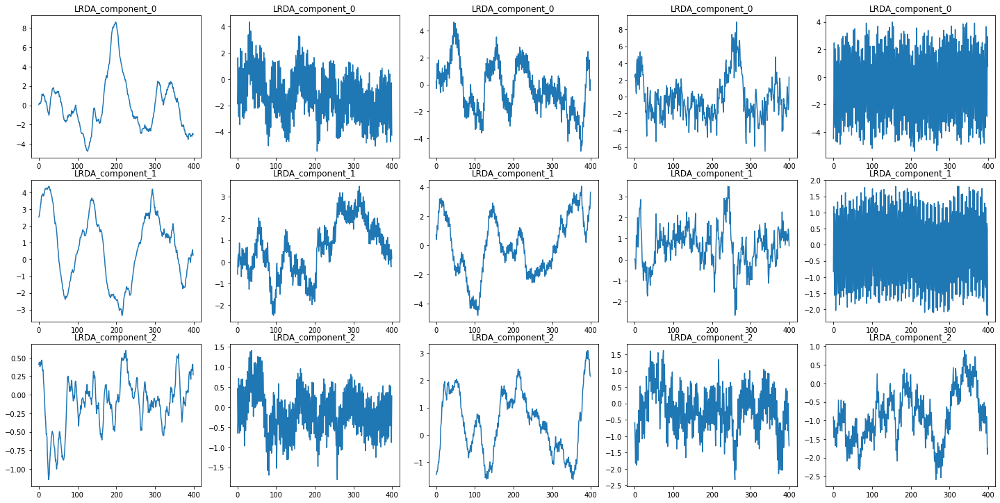

In [32]:
sub_eeg_list = [lrda_left_pca1[0:400], lrda_left_pca2[0:400], lrda_left_pca3[0:400], 
                lrda_left_pca4[0:400], lrda_left_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

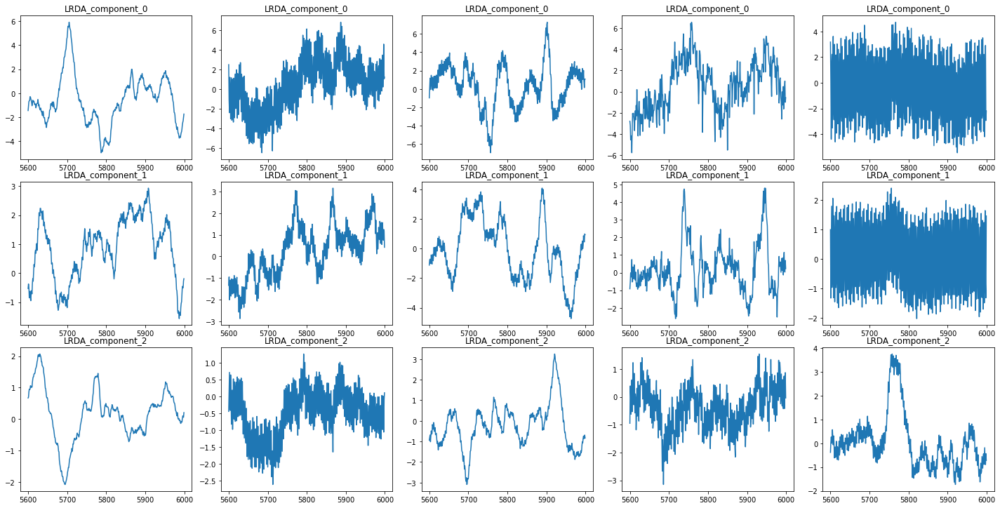

In [33]:
sub_eeg_list = [lrda_left_pca1[5600:6000], lrda_left_pca2[5600:6000], lrda_left_pca3[5600:6000], 
                lrda_left_pca4[5600:6000], lrda_left_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

##### LRDA Right Hemisphere

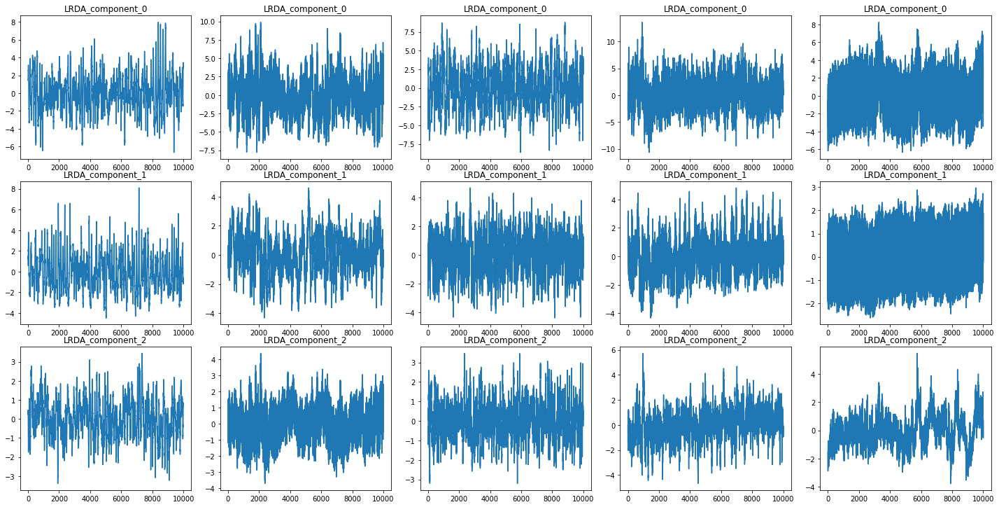

In [34]:
lrda_right_pca1, lrda_right_r1 = pca_function(scale(lrda_df, lrda_random[0]), right, 3)
lrda_right_pca2, lrda_right_r2 = pca_function(scale(lrda_df, lrda_random[1]), right, 3)
lrda_right_pca3, lrda_right_r3 = pca_function(scale(lrda_df, lrda_random[2]), right, 3)
lrda_right_pca4, lrda_right_r4 = pca_function(scale(lrda_df, lrda_random[3]), right, 3)
lrda_right_pca5, lrda_right_r5 = pca_function(scale(lrda_df, lrda_random[4]), right, 3)

components = lrda_right_pca1.columns

sub_eeg_list = [lrda_right_pca1, lrda_right_pca2, lrda_right_pca3, lrda_right_pca4, 
               lrda_right_pca5]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

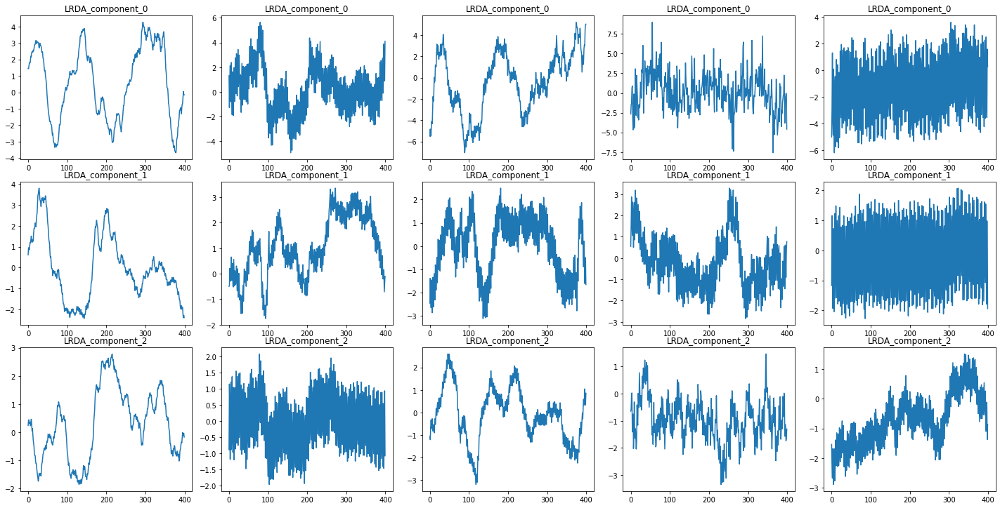

In [35]:
sub_eeg_list = [lrda_right_pca1[0:400], lrda_right_pca2[0:400], lrda_right_pca3[0:400], 
                lrda_right_pca4[0:400], lrda_right_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

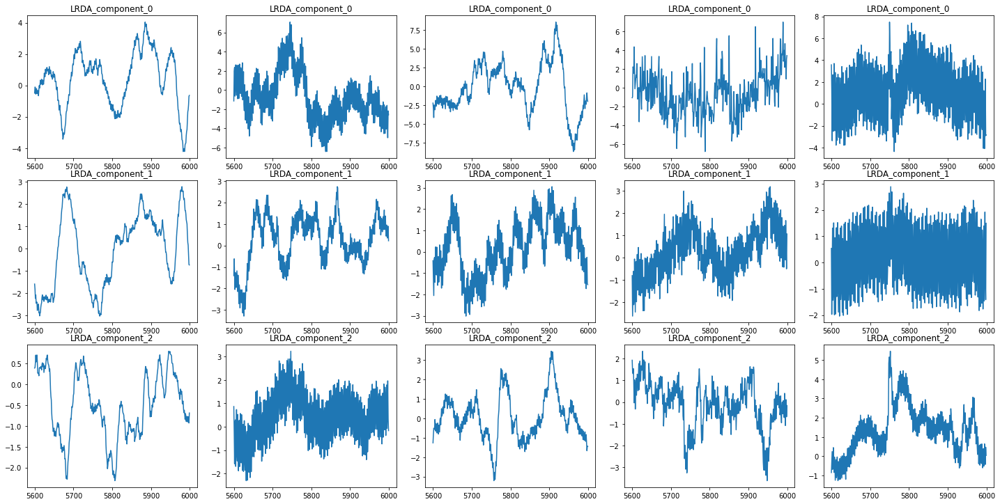

In [36]:
sub_eeg_list = [lrda_right_pca1[5600:6000], lrda_right_pca2[5600:6000], lrda_right_pca3[5600:6000], 
                lrda_right_pca4[5600:6000], lrda_right_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['LRDA'], components, 10, 20)

##### GRDA Left Hemisphere

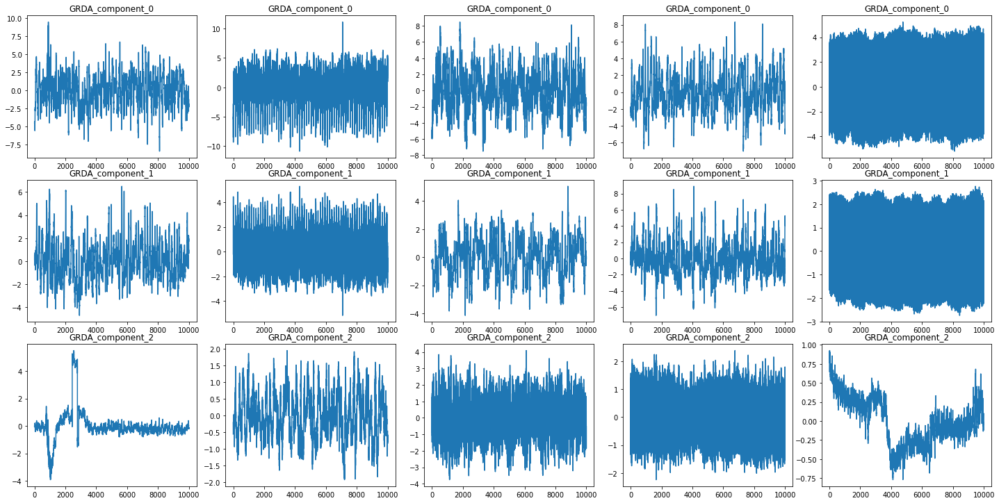

In [37]:
grda_left_pca1, grda_left_r1 = pca_function(scale(grda_df, grda_random[0]), left, 3)
grda_left_pca2, grda_left_r2 = pca_function(scale(grda_df, grda_random[1]), left, 3)
grda_left_pca3, grda_left_r3 = pca_function(scale(grda_df, grda_random[2]), left, 3)
grda_left_pca4, grda_left_r4 = pca_function(scale(grda_df, grda_random[3]), left, 3)
grda_left_pca5, grda_left_r5 = pca_function(scale(grda_df, grda_random[4]), left, 3)

components = grda_left_pca1.columns

sub_eeg_list = [grda_left_pca1, grda_left_pca2, grda_left_pca3, grda_left_pca4, 
               grda_left_pca5]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

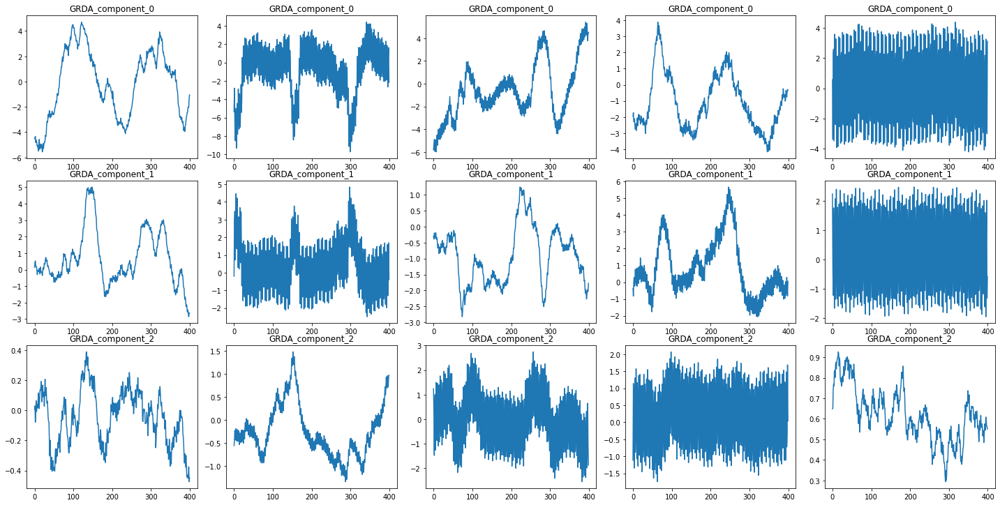

In [38]:
sub_eeg_list = [grda_left_pca1[0:400], grda_left_pca2[0:400], grda_left_pca3[0:400], 
                grda_left_pca4[0:400], grda_left_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

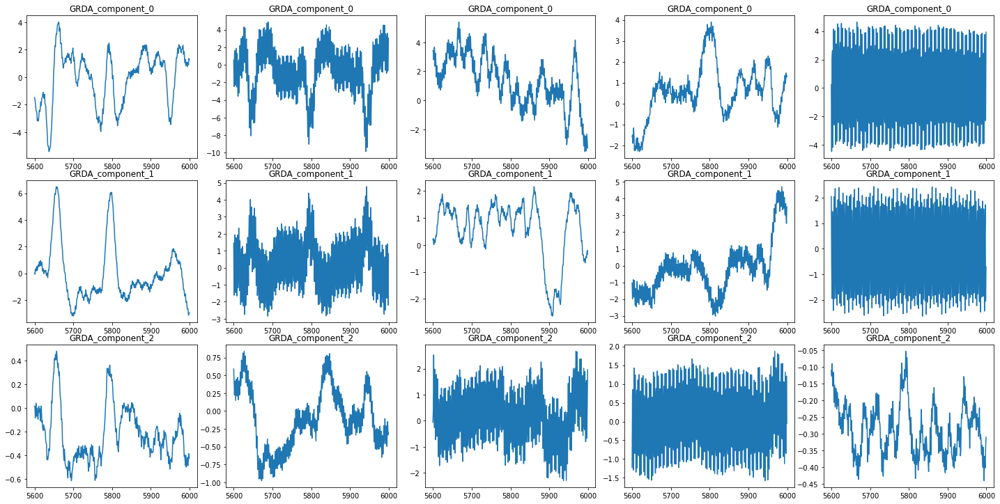

In [39]:
sub_eeg_list = [grda_left_pca1[5600:6000], grda_left_pca2[5600:6000], grda_left_pca3[5600:6000], 
                grda_left_pca4[5600:6000], grda_left_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

##### GRDA Right Hemisphere

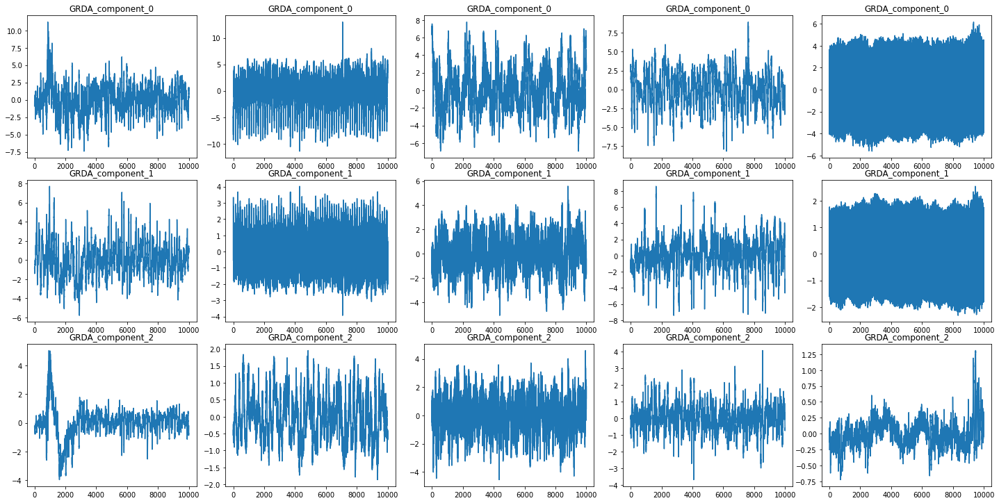

In [40]:
grda_right_pca1, grda_right_r1 = pca_function(scale(grda_df, grda_random[0]), right, 3)
grda_right_pca2, grda_right_r2 = pca_function(scale(grda_df, grda_random[1]), right, 3)
grda_right_pca3, grda_right_r3 = pca_function(scale(grda_df, grda_random[2]), right, 3)
grda_right_pca4, grda_right_r4 = pca_function(scale(grda_df, grda_random[3]), right, 3)
grda_right_pca5, grda_right_r5 = pca_function(scale(grda_df, grda_random[4]), right, 3)

components = grda_right_pca1.columns

sub_eeg_list = [grda_right_pca1, grda_right_pca2, grda_right_pca3, grda_right_pca4, 
               grda_right_pca5]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

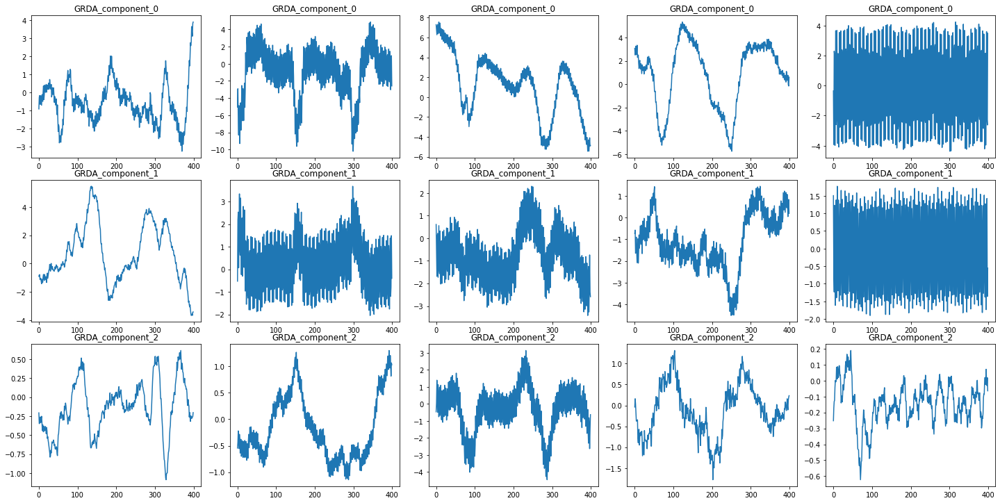

In [41]:
sub_eeg_list = [grda_right_pca1[0:400], grda_right_pca2[0:400], grda_right_pca3[0:400], 
                grda_right_pca4[0:400], grda_right_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

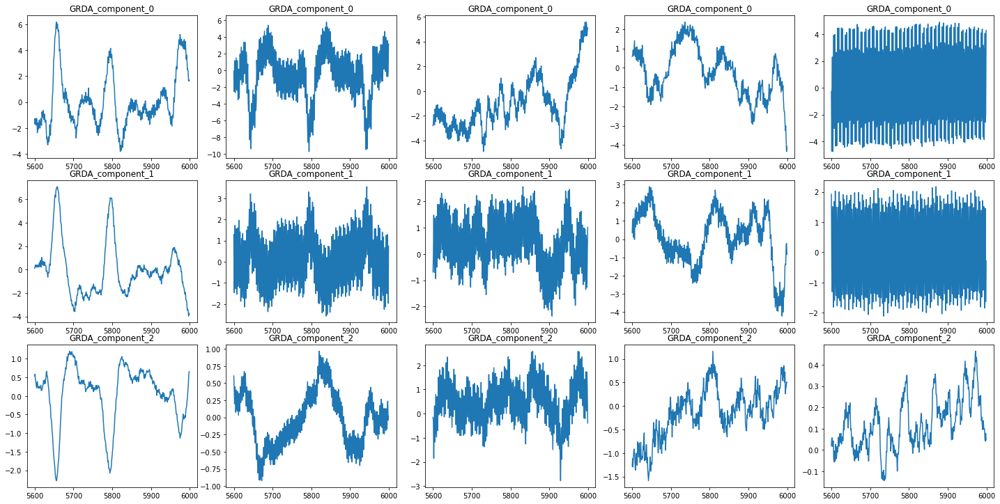

In [42]:
sub_eeg_list = [grda_right_pca1[5600:6000], grda_right_pca2[5600:6000], grda_right_pca3[5600:6000], 
                grda_right_pca4[5600:6000], grda_right_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['GRDA'], components, 10, 20)

##### Other Left Hemisphere

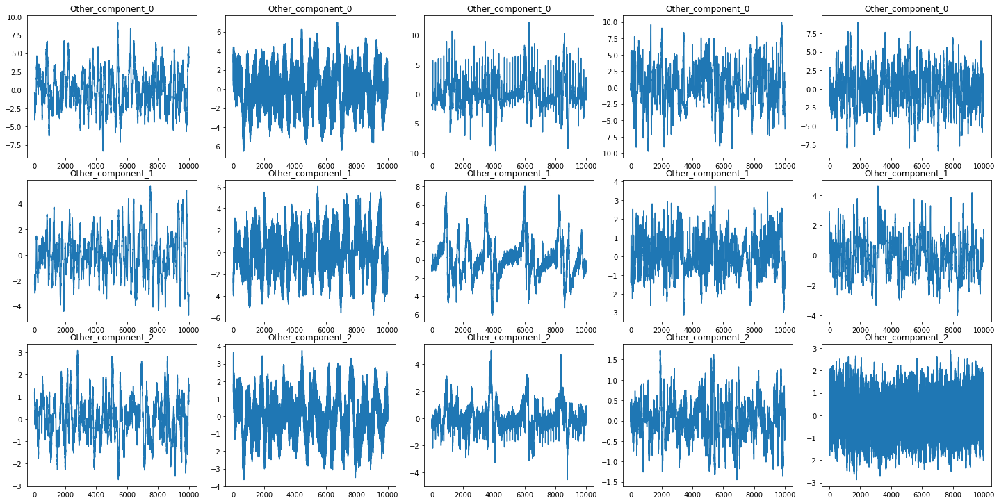

In [43]:
other_left_pca1, other_left_r1 = pca_function(scale(other_df, other_random[0]), left, 3)
other_left_pca2, other_left_r2 = pca_function(scale(other_df, other_random[1]), left, 3)
other_left_pca3, other_left_r3 = pca_function(scale(other_df, other_random[2]), left, 3)
other_left_pca4, other_left_r4 = pca_function(scale(other_df, other_random[3]), left, 3)
other_left_pca5, other_left_r5 = pca_function(scale(other_df, other_random[4]), left, 3)

components = other_left_pca1.columns

sub_eeg_list = [other_left_pca1, other_left_pca2, other_left_pca3, other_left_pca4, 
               other_left_pca5]
activity_signal_plots(sub_eeg_list, ['Other'], components, 10, 20)

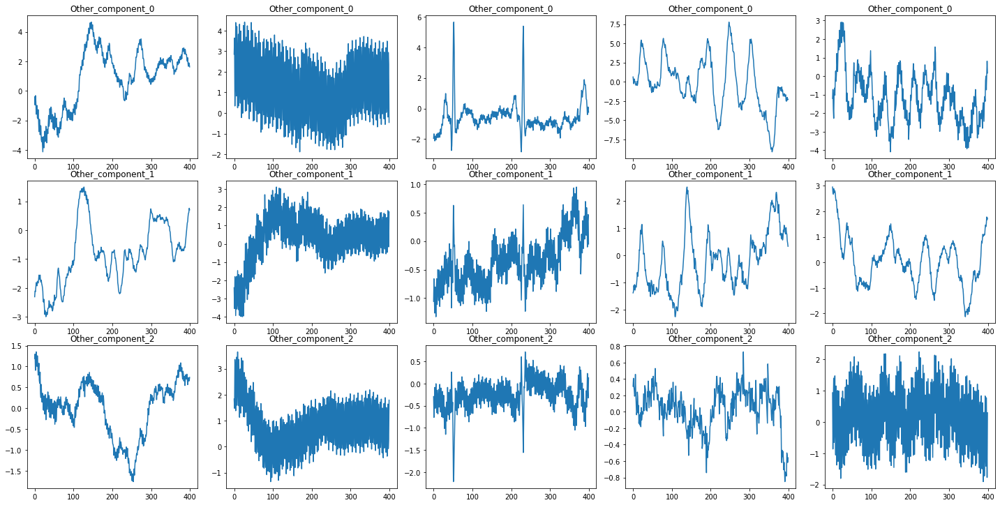

In [44]:
sub_eeg_list = [other_left_pca1[0:400], other_left_pca2[0:400], other_left_pca3[0:400], 
                other_left_pca4[0:400], other_left_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 10, 20)

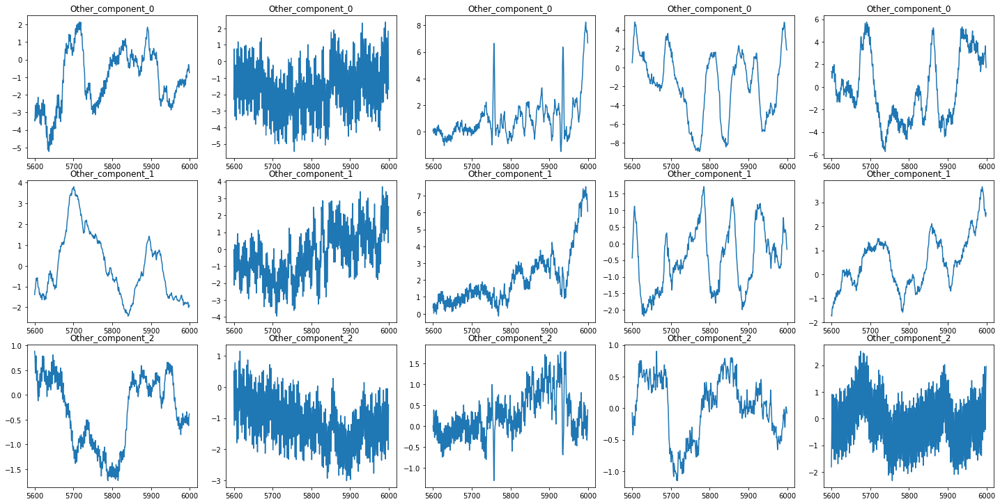

In [45]:
sub_eeg_list = [other_left_pca1[5600:6000], other_left_pca2[5600:6000], other_left_pca3[5600:6000], 
                other_left_pca4[5600:6000], other_left_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 10, 20)

##### Other Right Hemisphere

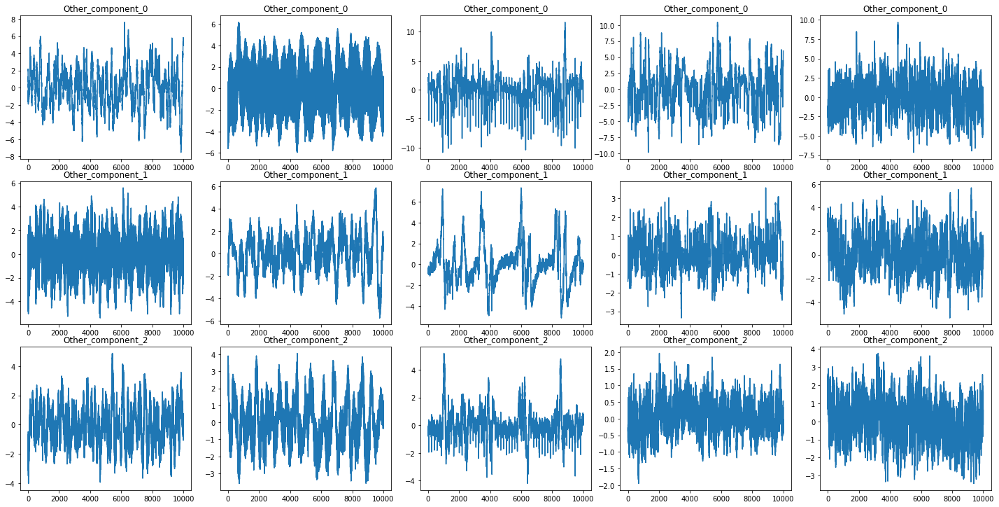

In [46]:
other_right_pca1, other_right_r1 = pca_function(scale(other_df, other_random[0]), right, 3)
other_right_pca2, other_right_r2 = pca_function(scale(other_df, other_random[1]), right, 3)
other_right_pca3, other_right_r3 = pca_function(scale(other_df, other_random[2]), right, 3)
other_right_pca4, other_right_r4 = pca_function(scale(other_df, other_random[3]), right, 3)
other_right_pca5, other_right_r5 = pca_function(scale(other_df, other_random[4]), right, 3)

components = other_right_pca1.columns

sub_eeg_list = [other_right_pca1, other_right_pca2, other_right_pca3, other_right_pca4, 
               other_right_pca5]
activity_signal_plots(sub_eeg_list, ['Other'], components, 10, 20)

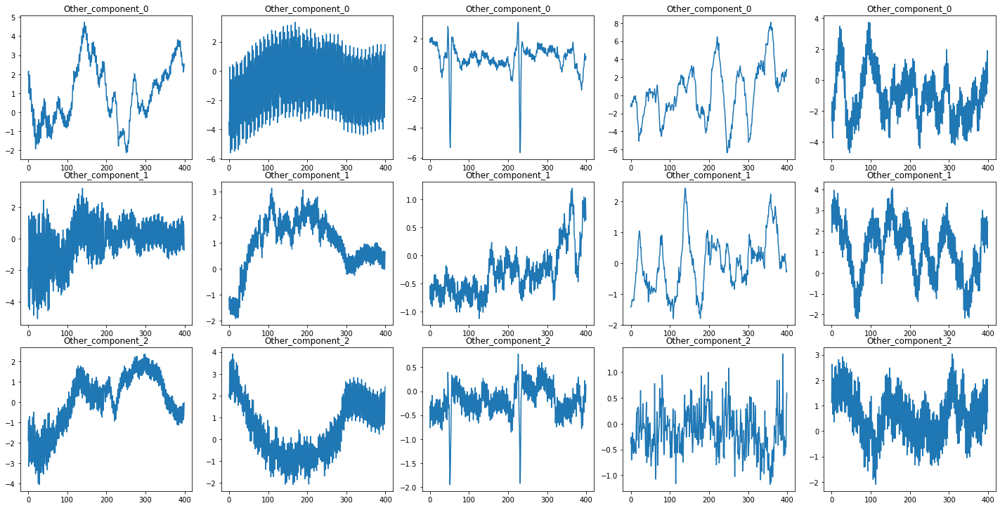

In [47]:
sub_eeg_list = [other_right_pca1[0:400], other_right_pca2[0:400], other_right_pca3[0:400], 
                other_right_pca4[0:400], other_right_pca5[0:400]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 10, 20)

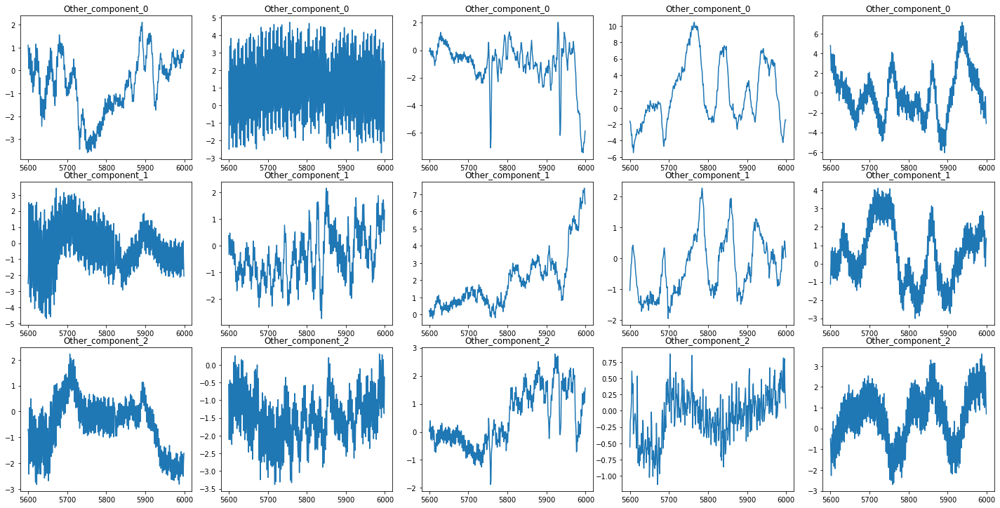

In [48]:
sub_eeg_list = [other_right_pca1[5600:6000], other_right_pca2[5600:6000], other_right_pca3[5600:6000], 
                other_right_pca4[5600:6000], other_right_pca5[5600:6000]]
activity_signal_plots(sub_eeg_list, ['Other'], components, 10, 20)

### Left vs. Right Hemisphere Plots  
  
I'll do three sub EEGs for each activity type and show their left hemisphere components and right hemisphere components side by side. I'll start with Seizure activity and then lateralized activity because these are the categories that should show more substantial differences by hemisphere.  
  
##### Seizure Left vs. Right Hemisphere

In [49]:
seizure_indexes = [i for i in range(seizure_df.shape[0])]
seizure_randoms = np.random.choice(seizure_indexes, size = 3, replace = False)

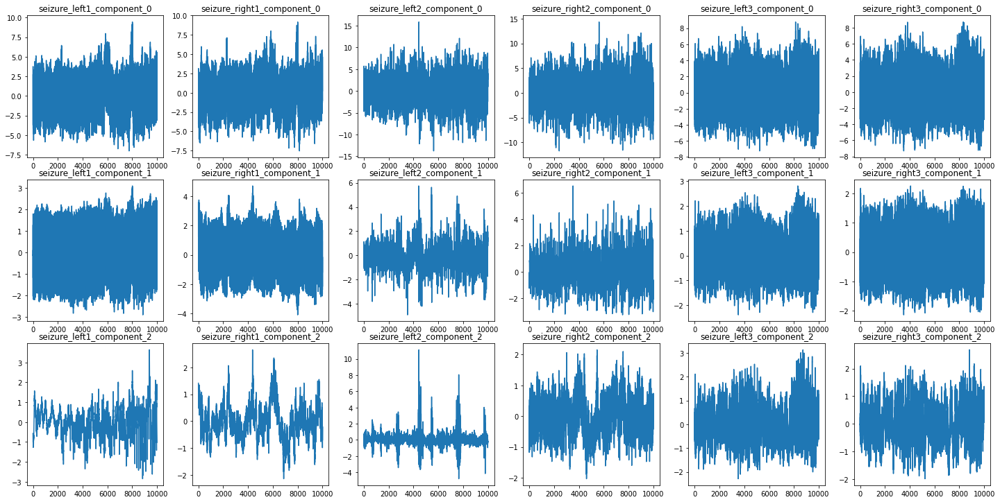

In [50]:
seizure_left1, seizure_left1_ratio = pca_function(scale(seizure_df, seizure_randoms[0]), left, 3)
seizure_right1, seizure_right1_ratio = pca_function(scale(seizure_df, seizure_randoms[0]), right, 3)
seizure_left2, seizure_left2_ratio = pca_function(scale(seizure_df, seizure_randoms[1]), left, 3)
seizure_right2, seizure_right2_ratio = pca_function(scale(seizure_df, seizure_randoms[1]), right, 3)
seizure_left3, seizure_left3_ratio = pca_function(scale(seizure_df, seizure_randoms[2]), left, 3)
seizure_right3, seizure_right3_ratio = pca_function(scale(seizure_df, seizure_randoms[2]), right, 3)

components = seizure_left1.columns

sub_eeg_list = [seizure_left1, seizure_right1, seizure_left2,
                seizure_right2, seizure_left3, seizure_right3]
names = ['seizure_left1', 'seizure_right1', 'seizure_left2',
         'seizure_right2', 'seizure_left3', 'seizure_right3']
activity_signal_plots(sub_eeg_list, names, components, 10, 20)

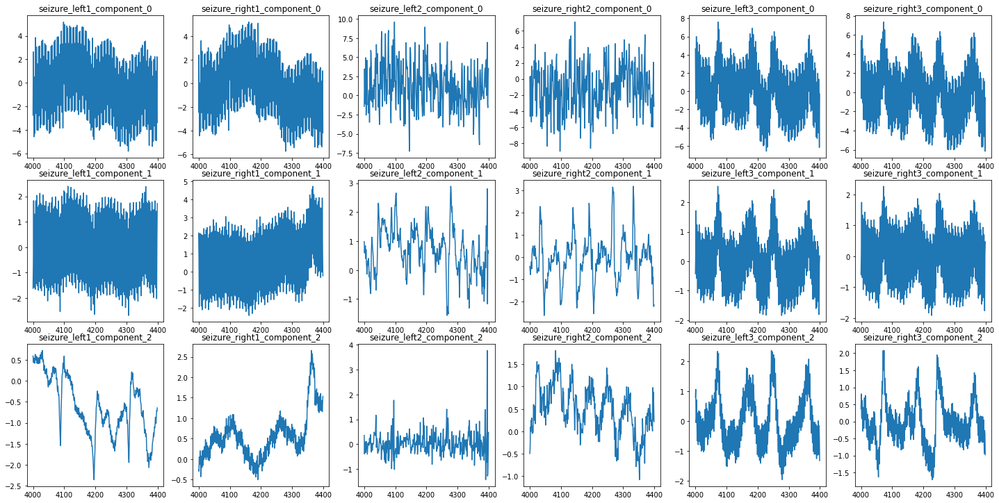

In [51]:
sub_eeg_list = [seizure_left1[4000:4400], seizure_right1[4000:4400], seizure_left2[4000:4400],
                seizure_right2[4000:4400], seizure_left3[4000:4400], seizure_right3[4000:4400]]
names = ['seizure_left1', 'seizure_right1', 'seizure_left2',
         'seizure_right2', 'seizure_left3', 'seizure_right3']
activity_signal_plots(sub_eeg_list, names, components, 10, 20)

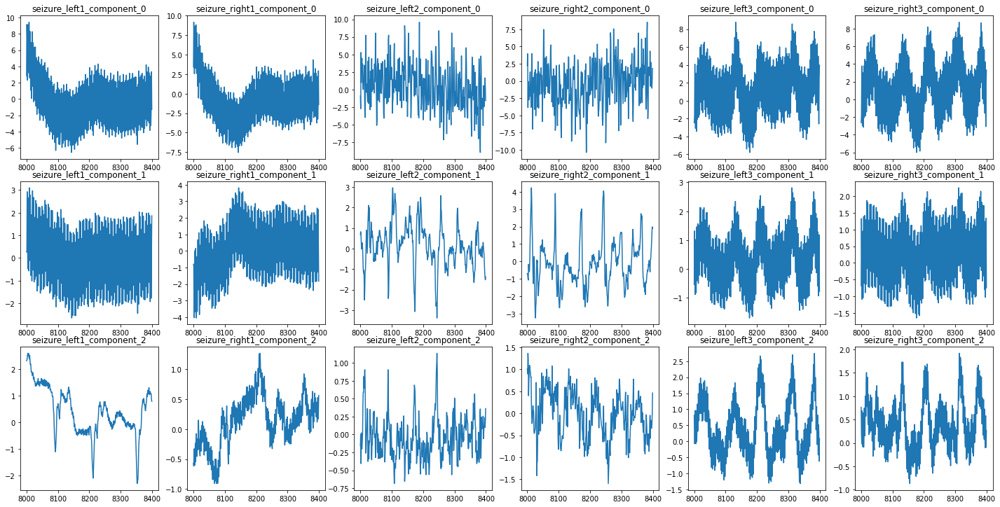

In [52]:
sub_eeg_list = [seizure_left1[8000:8400], seizure_right1[8000:8400], seizure_left2[8000:8400],
                seizure_right2[8000:8400], seizure_left3[8000:8400], seizure_right3[8000:8400]]
names = ['seizure_left1', 'seizure_right1', 'seizure_left2',
         'seizure_right2', 'seizure_left3', 'seizure_right3']
activity_signal_plots(sub_eeg_list, names, components, 10, 20)

##### LPD Left vs. Right Hemisphere

In [53]:
lpd_indexes = [i for i in range(lpd_df.shape[0])]
lpd_randoms = np.random.choice(lpd_indexes, size = 3, replace = False)

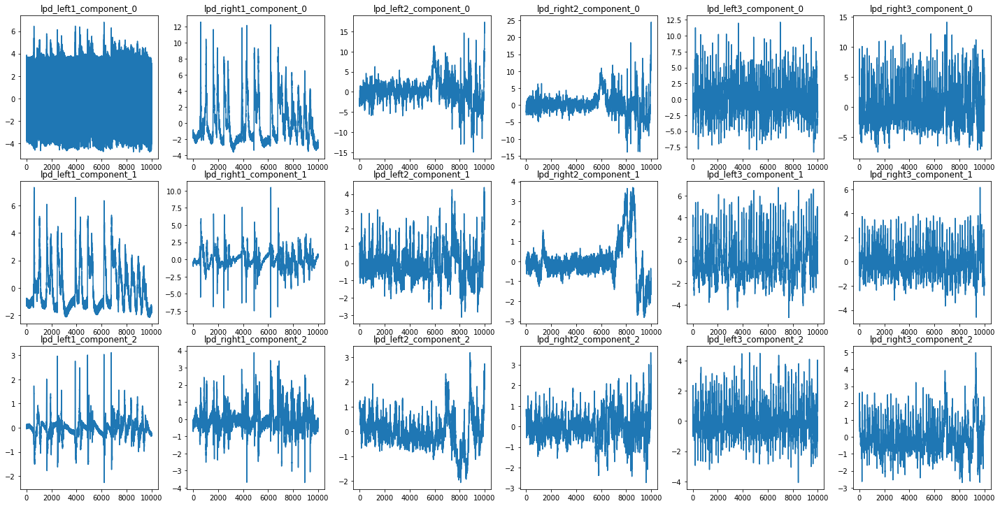

In [54]:
lpd_left1, lpd_left1_ratio = pca_function(scale(lpd_df, lpd_randoms[0]), left, 3)
lpd_right1, lpd_right1_ratio = pca_function(scale(lpd_df, lpd_randoms[0]), right, 3)
lpd_left2, lpd_left2_ratio = pca_function(scale(lpd_df, lpd_randoms[1]), left, 3)
lpd_right2, lpd_right2_ratio = pca_function(scale(lpd_df, lpd_randoms[1]), right, 3)
lpd_left3, lpd_left3_ratio = pca_function(scale(lpd_df, lpd_randoms[2]), left, 3)
lpd_right3, lpd_right3_ratio = pca_function(scale(lpd_df, lpd_randoms[2]), right, 3)

components = lpd_left1.columns

sub_eeg_list = [lpd_left1, lpd_right1, lpd_left2,
                lpd_right2, lpd_left3, lpd_right3]
names = ['lpd_left1', 'lpd_right1', 'lpd_left2',
         'lpd_right2', 'lpd_left3', 'lpd_right3']
activity_signal_plots(sub_eeg_list, names, components, 10, 20)

In [61]:
lpd_randoms[0]

7635

In [62]:
lpd1 = scale(lpd_df, 7635)

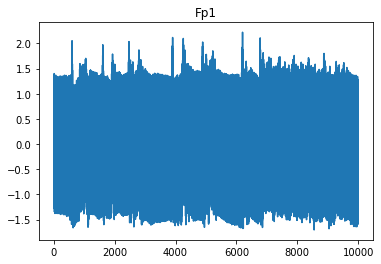

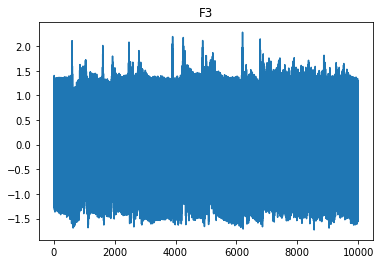

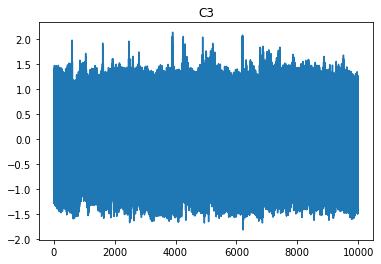

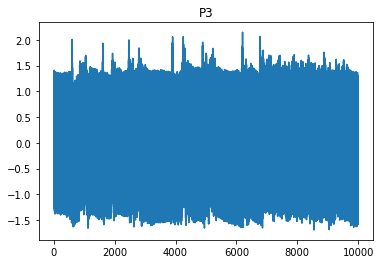

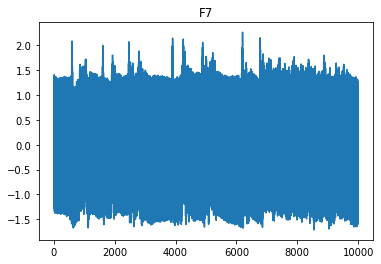

...

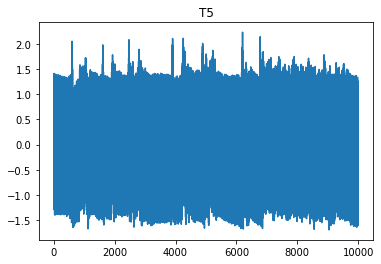

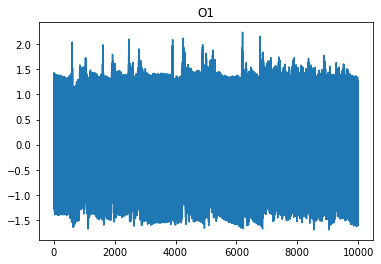

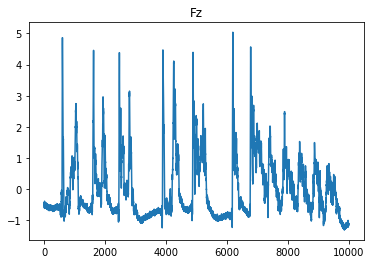

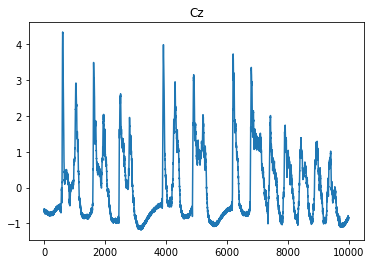

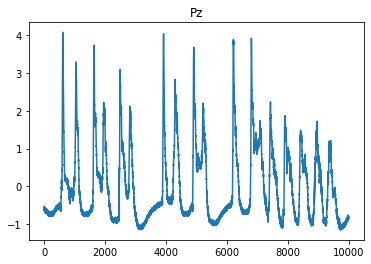

In [66]:
for electrode in left:
    plt.plot(lpd1[electrode])
    plt.title('{}'.format(electrode))
    plt.show()

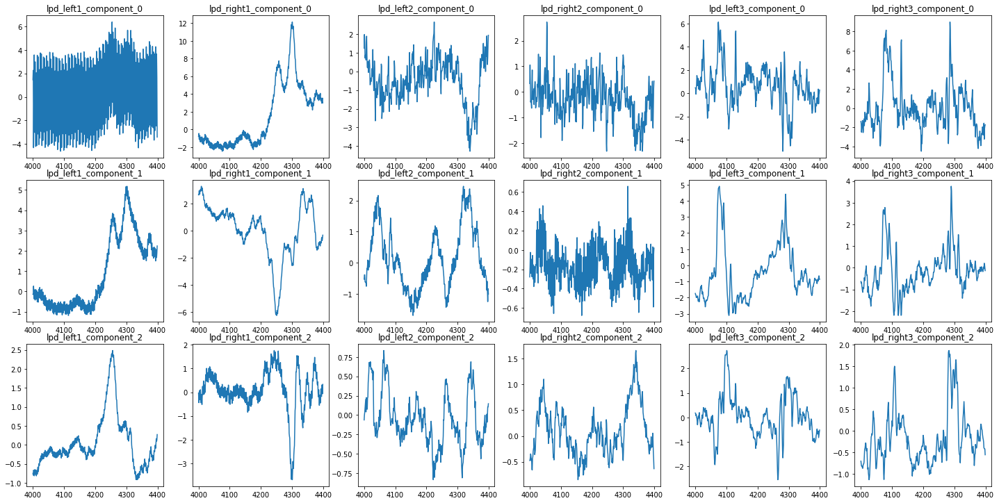

In [55]:
sub_eeg_list = [lpd_left1[4000:4400], lpd_right1[4000:4400], lpd_left2[4000:4400],
                lpd_right2[4000:4400], lpd_left3[4000:4400], lpd_right3[4000:4400]]
names = ['lpd_left1', 'lpd_right1', 'lpd_left2',
         'lpd_right2', 'lpd_left3', 'lpd_right3']
activity_signal_plots(sub_eeg_list, names, components, 10, 20)

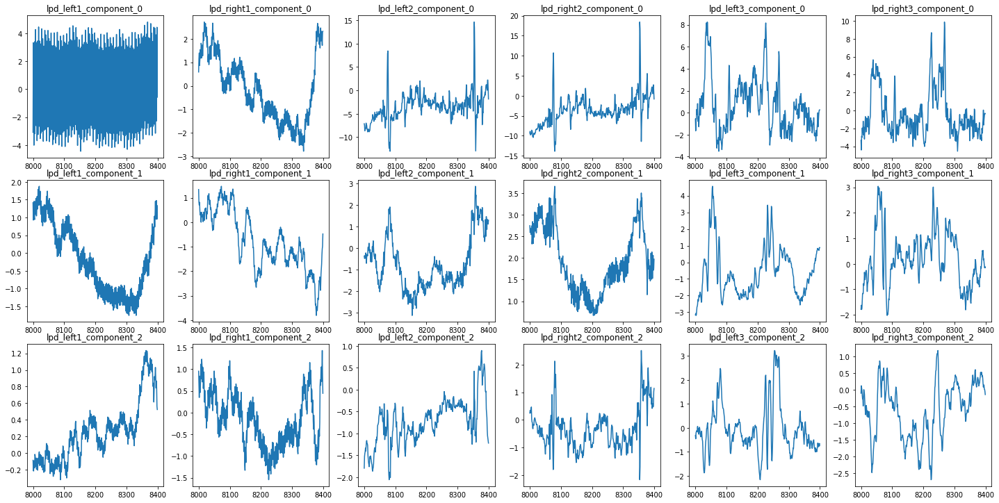

In [56]:
sub_eeg_list = [lpd_left1[8000:8400], lpd_right1[8000:8400], lpd_left2[8000:8400],
                lpd_right2[8000:8400], lpd_left3[8000:8400], lpd_right3[8000:8400]]
names = ['lpd_left1', 'lpd_right1', 'lpd_left2',
         'lpd_right2', 'lpd_left3', 'lpd_right3']
activity_signal_plots(sub_eeg_list, names, components, 10, 20)

##### LRDA Left vs. Right Hemisphere

In [57]:
lrda_indexes = [i for i in range(lrda_df.shape[0])]
lrda_randoms = np.random.choice(lrda_indexes, size = 3, replace = False)

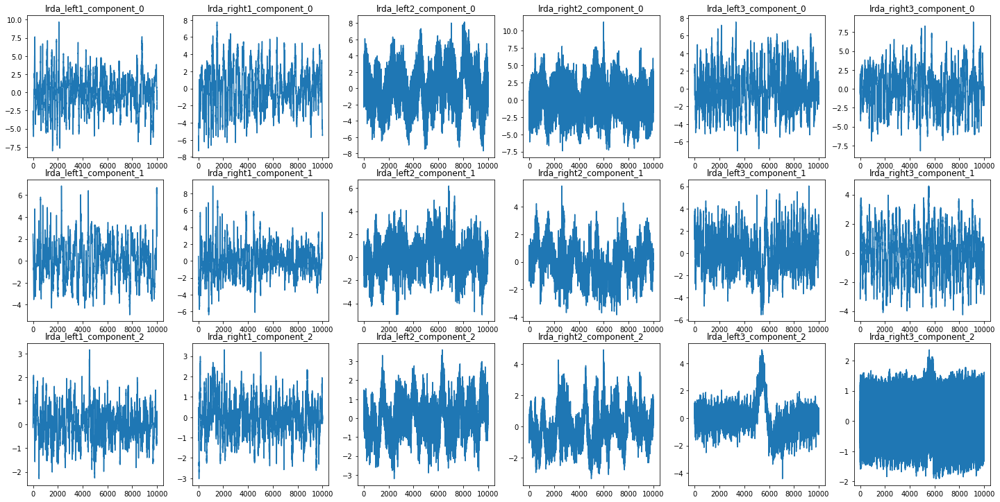

In [58]:
lrda_left1, lrda_left1_ratio = pca_function(scale(lrda_df, lrda_randoms[0]), left, 3)
lrda_right1, lrda_right1_ratio = pca_function(scale(lrda_df, lrda_randoms[0]), right, 3)
lrda_left2, lrda_left2_ratio = pca_function(scale(lrda_df, lrda_randoms[1]), left, 3)
lrda_right2, lrda_right2_ratio = pca_function(scale(lrda_df, lrda_randoms[1]), right, 3)
lrda_left3, lrda_left3_ratio = pca_function(scale(lrda_df, lrda_randoms[2]), left, 3)
lrda_right3, lrda_right3_ratio = pca_function(scale(lrda_df, lrda_randoms[2]), right, 3)

components = lrda_left1.columns

sub_eeg_list = [lrda_left1, lrda_right1, lrda_left2,
                lrda_right2, lrda_left3, lrda_right3]
names = ['lrda_left1', 'lrda_right1', 'lrda_left2',
         'lrda_right2', 'lrda_left3', 'lrda_right3']
activity_signal_plots(sub_eeg_list, names, components, 10, 20)

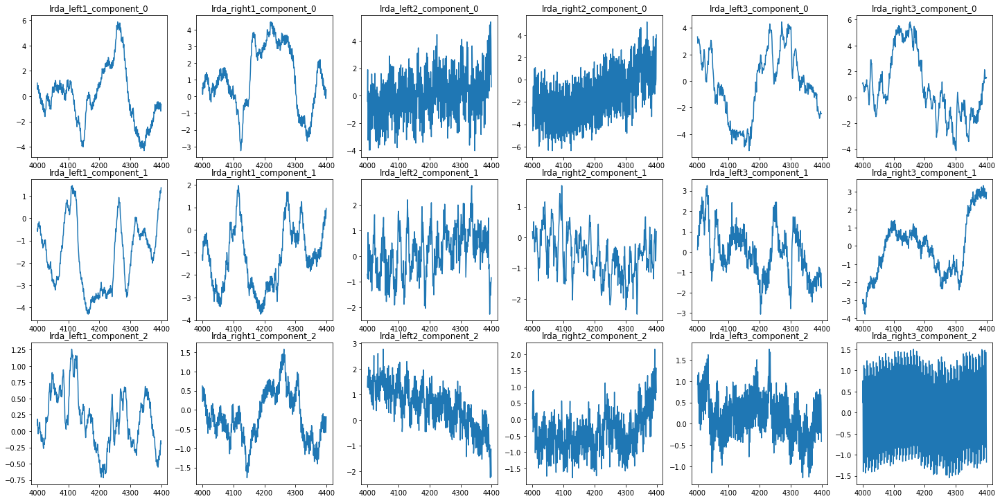

In [59]:
sub_eeg_list = [lrda_left1[4000:4400], lrda_right1[4000:4400], lrda_left2[4000:4400],
                lrda_right2[4000:4400], lrda_left3[4000:4400], lrda_right3[4000:4400]]
names = ['lrda_left1', 'lrda_right1', 'lrda_left2',
         'lrda_right2', 'lrda_left3', 'lrda_right3']
activity_signal_plots(sub_eeg_list, names, components, 10, 20)

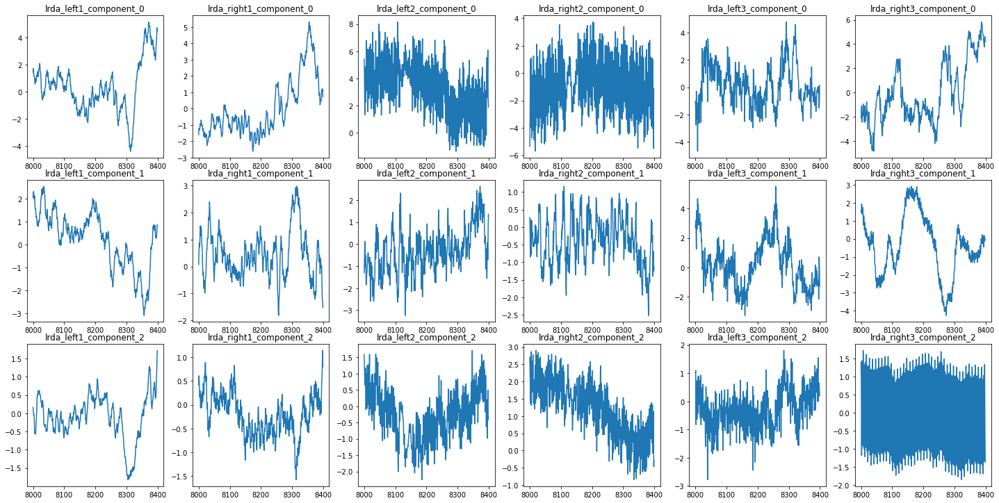

In [60]:
sub_eeg_list = [lrda_left1[8000:8400], lrda_right1[8000:8400], lrda_left2[8000:8400],
                lrda_right2[8000:8400], lrda_left3[8000:8400], lrda_right3[8000:8400]]
names = ['lrda_left1', 'lrda_right1', 'lrda_left2',
         'lrda_right2', 'lrda_left3', 'lrda_right3']
activity_signal_plots(sub_eeg_list, names, components, 10, 20)